In [53]:
import numpy as np
import pandas as pd
import requests
from datetime import date
from dateutil.relativedelta import relativedelta
import yfinance as yf
import matplotlib.pyplot as plt
import matplotlib.cm as cm

<h1 style="text-align: center;"><strong>DACS Architecture</strong></h1>

- Credit Score (25%)
- Assets under Management (25%)
- Volatility Score (20%)
- Asseet Quality Matrix (15%)
- Liquidity Adjusted Net worth (15%)

<h3 style="text-align: center;"><strong>Fetch Cryptocurrency Price</strong></h3>

In [10]:
def fetch_price(coin_id, period = '1y'):
    """
    Fetch historical daily prices for a cryptocurrency and return or add to a DataFrame.

    Parameters:
    - coin_id: coin ticker in Yahoo Finance e.g. 'BTC-USD'
    - period: Period to retrieve data from.

    Returns:
    - A dataframe containing price data with columns 'Date','Close' and 'Returns'
    """
    coin = yf.Ticker(f"{coin_id}-USD") # 'USD': coin-id against US Dollar by default
    coin_data = coin.history(period=f"{period}")
    coin_data.index = coin_data.index.tz_localize(None)
    coin_data['returns'] = coin_data['Close'].pct_change()
    coin_data = coin_data.dropna()
    coin_data = coin_data[['Close', 'returns']]
    coin_data = coin_data.iloc[1:]
    return coin_data

<p style="text-align: center;"><strong>The code below will simulate a user buying $100,000 worth of the total crypto market cap as if it were an asset with a description of the math below:</strong></p>

<p style="text-align: center;"><strong></strong></p>

$$\text{Portfolio Value} = I \times \frac{M_t}{M_0}$$


<p><strong>Where</strong></p>

- $I$: Is the ammount of Initial Investment
- $M_t$: Is the total crypto market cap at time t
- $M_0$: Total market cap at the time of purchase

This way, at $\text{Time}_0$, the number starts at 1.0 and gradually increases / decreases as time increases

<p style="text-align: center;"><strong>Fetch Total Crypto Market Capitalization from last year as an index</strong></p>

In [11]:
def fetch_marketcap_history(api_key, start_date, end_date):
    url = "https://pro-api.coinmarketcap.com/v1/global-metrics/quotes/historical"
    
    headers = {
        'Accepts': 'application/json',
        'X-CMC_PRO_API_KEY': api_key,
    }

    params = {
        'time_start': start_date,   # format: 'YYYY-MM-DD'
        'time_end': end_date,       # format: 'YYYY-MM-DD'
        'interval': 'daily',
        'convert': 'USD'
    }

    response = requests.get(url, headers=headers, params=params)
    data = response.json()

    # Extract and convert to DataFrame
    quotes = data['data']['quotes']
    df = pd.DataFrame([{
        'Date': q['timestamp'][:10],
        'Close': q['quote']['USD']['total_market_cap'],
    } for q in quotes])
    
    df['Date'] = pd.to_datetime(df['Date'])
    df.set_index('Date', inplace=True)
    df['returns'] = df['Close'].pct_change()
    df = df.dropna()
    df = df.iloc[1:]

    return df

# Replace this with your actual API key
api_key = 'c1bde33f-30b5-4dc1-8661-3af9b8bfab4e'


# One year date range (you can adjust as needed)
start_date = (date.today() - relativedelta(days = 363)).strftime('%Y-%m-%d')
end_date = date.today().strftime('%Y-%m-%d')

total_data = fetch_marketcap_history(api_key, start_date, end_date)

In [12]:
def simulate_marketcap_investment(df_marketcap, investment_amount = 100000):
    """
    Simulate buying the total crypto market cap like an index fund.
    
    Parameters:
        df_marketcap (DataFrame): must contain 'total_market_cap' column indexed by date
        investment_amount (float): how much the user invests on the first day
        
    Returns:
        DataFrame with simulated portfolio value over time
    """
    df = df_marketcap.copy()

    # Normalize to start at 1.0 and scale to the investment amount
    # It's a bit confusing because Close is the closing price of the market cap but will be changed
    # to the closing portfolio price if the user were to invest in the total market cap
    initial_cap = df['Close'].iloc[0]
    df['index'] = df['Close'] / initial_cap
    df['portfolio_value'] = df['index'] * investment_amount

    # Building a dataframe with 'Close' and 'returns' column like the other ones in this notebook
    df['Close'] = df['portfolio_value']
    # Remove timezone info for consistency
    if df.index.tz is not None:
        df.index = df.index.tz_localize(None)
    df['returns'] = df['Close'].pct_change()
    df = df.dropna()
    df = df[['Close', 'returns']]
    df = df.iloc[1:]

    return df

In [13]:
total_data_index = simulate_marketcap_investment(total_data)
total_data_index

,Close,returns
Date,,
2024-06-16,99897.323237,0.008369
2024-06-17,100832.352531,0.009360
2024-06-18,99129.636620,-0.016887
2024-06-19,97209.821637,-0.019367
2024-06-20,97713.508654,0.005181
...,...,...
2025-06-05,135861.056245,-0.006729
2025-06-06,130944.376421,-0.036189
2025-06-07,134211.478665,0.024950


<h3 style="text-align: center;"><strong>Visualization functions</strong></h3>

In [74]:
def plot_returns(portfolio_df, index_dict=None):
    """
    Plot daily returns of the portfolio against multiple indices (if provided).

    Parameters:
    - portfolio_df: DataFrame with a 'returns' column.
    - index_dict (optional): Dict of name -> DataFrame, each with a 'returns' column.

    The visualization helps assess the 'quality' of the portfolio—ideal assets should show fewer violent swings.
    """
    plt.figure(figsize=(12, 6))
    plt.plot(portfolio_df.index, portfolio_df['returns'], label='Portfolio Returns', color='blue')

    if index_dict:
        colors = cm.get_cmap('Set1', len(index_dict))
        for i, (name, df) in enumerate(index_dict.items()):
            plt.plot(df.index, df['returns'], label=f'{name} Returns', color=colors(i))

    plt.title('Daily Returns: Portfolio vs Indices' if index_dict else 'Daily Returns: Portfolio')
    plt.xlabel('Date')
    plt.ylabel('Daily Return')
    plt.ylim(-0.2,0.2)

    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()


def plot_price(portfolio_df, index_dict):
    """
    Plot closing prices of the portfolio against multiple indices.

    Parameters:
    - portfolio_df: DataFrame with a 'Close' column.
    - index_dict: Dict of name -> DataFrame, each with a 'Close' column.

    The plot_price function is used to indicate the volatility trend and how the portfolio performs compared to relevant 
    market indexes like Bitcoin, (TIPS) and the total crypto market capitalization. A very high volatility score would 
    indicate a very big deviation of price movement of the portfolio/asset from the index

    """
    plt.figure(figsize=(12, 6))
    plt.plot(portfolio_df.index, portfolio_df['Close'], label='Portfolio Price', color='blue')
    
    colors = cm.get_cmap('Set1', len(index_dict))
    for i, (name, df) in enumerate(index_dict.items()):
        plt.plot(df.index, df['Close'], label=f'{name} Price', color=colors(i))

    plt.title('Price Trend: Portfolio vs Indices')
    plt.xlabel('Date')
    plt.ylabel('Price (USD)')
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()



<strong>Notes for Volatility Score and AQM: code is very messy for calculating individual portfolios because decisions on what index(es) to use is still in the works</strong>

<h3 style="text-align: center;"><strong>Volatility Score</strong></h3>

The core component of the Digital Asset Credit Score (DACS) is the volatility score, which quantifies the relative stability of each digital asset a user intends to use as collateral. This score is calculated as the ratio of the asset's volatility to that of a selected market index over the past 365 days:

$$\text{Volatility Score} = w_1\text{ Relative Volatility} + w_2\text{ Beta ratio} $$


<h4>Where:</h4>

- $$ \text{Relative Volatility} = \frac{\text{normalized}(\sigma_a)}{\text{normalized}(\sigma_m)} $$
 with $\sigma$ representing the standard deviations of the price of a given asset $ a $ and a market index $ m $ which represent overall volatility normalized for a fair comparison

- $$\text{Beta Ratio }(\beta) = \frac{\text{Cov}(R_a,R_m)}{\text{Var}(R_m)}$$
With $R_a$ and $R_m$ being the historic returns of asset $a$ and market $m$ respectively. Which measures the systemic risk and volatility of an asset $a$ against a market index $m$ taking into account a correlation factor $\text{Cov}(R_a,R_m)$


<p><strong>And</strong></p>

- $w_1, w_2$: Pre-determiend weights 



Note: I think there may be a need for 2 functions when we are ready for deployment, one for calculating the volatility scores of coins respectively and one for calculating the volatility score of the portfolio. The only difference is that in the function when calculating the volatility scores of coins, we should build on a dataframe/dictionary and the one calculating the volatility score of the portfolio is just going to return a float. 

In [49]:
def calculate_volatility_score_coin(coin_dict, index_data, rel_vol_weight=1, beta_weight=1):
    """
    Calculates a combined volatility score for each coin compared to an index.

    Parameters:
    - coin_dict: dict of {coin_name: DataFrame with 'Close' and 'returns'}
    - index_data: DataFrame with 'Close' and 'returns' columns for the benchmark
    - rel_vol_weight: weight for relative volatility
    - beta_weight: weight for beta ratio

    Returns:
    - dict of {coin_name: volatility_score}
    """

    dict_volatility_score = {}

    for name, coin_df in coin_dict.items():

        # Align dates
        common_dates = coin_df.index.intersection(index_data.index)
        coin_aligned = coin_df.loc[common_dates]
        index_aligned = index_data.loc[common_dates]

        if len(coin_aligned) == 0 or len(index_aligned) == 0:
            dict_volatility_score[name] = np.nan
            continue

        # Normalize both series
        coin_norm = coin_aligned['Close'] / coin_aligned['Close'].iloc[0]
        index_norm = index_aligned['Close'] / index_aligned['Close'].iloc[0]

        """ Relative Volatility """
        index_volatility = np.std(index_norm)
        coin_volatility = np.std(coin_norm)

        relative_volatility = coin_volatility / index_volatility if index_volatility != 0 else 0
        #print(f"Relative Volatility for {name}: {relative_volatility}")

        """ Beta Ratio """ 
        index_var = np.var(index_aligned['returns'])
        covar = np.cov(coin_aligned['returns'], index_aligned['returns'])[0][1]
        beta_ratio = covar / index_var if index_var != 0 else 0
        #print(f"Beta Ratio for {name}: {beta_ratio}")

        """ Final Score """
        volatility_score = rel_vol_weight * relative_volatility + beta_weight * beta_ratio

        dict_volatility_score[name] = volatility_score

    return dict_volatility_score



In [7]:
def calculate_volatility_score_portfolio(portfolio_data, index_data, rel_vol_weight=1, beta_weight=1):
    """
    Calculates the coin's volatility score compared to an index.

    Inputs:

    - portfolio_data: DataFrame with 'Close' and 'returns' columns
    - index:  market index to be compared to i.e sigma_m 

    Returns:
    - Volatility score (float): w_1 relative_volatility + w_2 beta_ratio
    A very high Volatility Score indicates high deviation of the coin's price behavior against the index.
    """


    """Relative Volatility:"""

    common_dates = portfolio_data.index.intersection(index_data.index)

    portfolio_aligned = portfolio_data.loc[common_dates]
    index_aligned = index_data.loc[common_dates]

    # Normalize both data
    coin_norm = portfolio_aligned['Close'] / portfolio_aligned['Close'].iloc[0]
    index_norm = index_aligned['Close'] / index_aligned['Close'].iloc[0]  

    index_volatility = np.std(index_norm)
    coin_volatility = np.std(coin_norm)

    if coin_volatility == 0:
        return 1.0

    relative_volatility = coin_volatility / index_volatility

    """ Beta Ratio: """

    index_var = np.var(index_aligned['returns'])
    covar = np.cov(portfolio_aligned['returns'], index_aligned['returns'])[0][1]

    beta_ratio = covar / index_var if index_var != 0 else 0

    """Final Score:"""

    volatility_score = rel_vol_weight * relative_volatility + beta_weight * beta_ratio    

    return volatility_score


<h3 style="text-align: center;"><strong>Asset Quality Matrix</strong></h3>

Asset Quality is measured as the 'quality' of the underlying asset which can be applied inclusively to all digital assets not limited to cryptocurrencies. The 'quality' of an asset is a measure for the likelihood that the asset will continue delivering expected returns in the long run. It is essentially calculated like how the beta ratio in finance is calculated:

$$\text{Asset Quality} = w_1 \text{ Sharpe Ratio} + w_2 \text{ Sortino Ratio} + w_3 \text{ R}^2 $$


<h4>Where:</h4>

- $$ \text{Sharpe Ratio} = \frac{\mathbb{E}(R_a - R_f)}{\sigma_p}$$
 with $R_p$ representing returns of the portfolio/asset and $R_f$ representing a 'risk-free' asset or market index. $\sigma_p$ representing the standard deviations of the price of the portfolio. The sharpe ratio is a measure of an investment's risk-adjusted performance taking into account a 'risk-free' asset's returns

- $$ \text{Sortino Ratio} = \frac{\mathbb{E}(R_a - R_f)}{\sigma_d}$$
 with $R_p$ representing returns of the portfolio/asset and $R_f$ representing a 'risk-free' asset or market index. $\sigma_d$ representing the standard deviations of the downside of the portfolio. The Sortino ratio is identical to the Sharpe ratio but instead of measuring the total deviations of price of the portfolio, the Sortino Ratio focuses on the downside risk of the portfolio

- $$\text{R}^2 = \text{Corr}(R_a, R_m)^2 = 1 - \frac{\text{SS}_\text{res}}{\text{SS}_\text{tot}}$$
With $R_a$ and $R_m$ being the historic returns of asset $a$ and market $m$ respectively. For simplicity, we will be using the first equation $(\text{Corr}(R_a, R_m)^2)$ which is equivelant to the right-hand side.  

The right hand side: $\text{SS}_\text{res} = \sum((y_i - \hat{y}_i)^2)$ which measures the residual sum of squares (errors in the regression between actual and predicted) and $\text{SS}_\text{tot} = \sum((y_i - \bar{y}_i)^2)$ which measures the total sum of squares (Variance of the regression)

$\text{R}^2$ measures the proportion of variance in the asset’s returns explained by a market benchmark.


<p><strong>And</strong></p>

- $w_1, w_2, w_3$: Pre-determiend weights 



Note: Same as Volatility Score, there should ideally be 2 separate Asset Quality Matrices, one for each individual coin and one for all of the collection of our user's portfolios

In [17]:
def calc_r_squared(asset_df, index_df):
    """
    This function calculates the R-squared value between two DataFrames. It is created for 
    cleaner code and more abstraction because calculating R-squared involves fitting a linear regression


    Input: 
    asset_df: a portfolio/coin df that has 'Close' and 'returns' columns
    index_df: a market index df that has 'Close' and 'returns' columns

    Returns:
    R-squared value (float) between the two DataFrames.
    """
    common_dates = asset_df.index.intersection(index_df.index)
    y = asset_df.loc[common_dates]['returns'].dropna()
    x = index_df.loc[common_dates]['returns'].dropna()

    # Final alignment in case dropna created mismatch
    common_dates = y.index.intersection(x.index)
    y = y.loc[common_dates].values
    x = x.loc[common_dates].values

    if len(x) == 0:
        return np.nan

    # Fit linear regression: y = alpha + beta * x
    x_mean = np.mean(x)
    y_mean = np.mean(y)

    beta = np.sum((x - x_mean) * (y - y_mean)) / np.sum((x - x_mean)**2)
    alpha = y_mean - beta * x_mean

    y_pred = alpha + beta * x

    ss_res = np.sum((y - y_pred)**2)
    ss_tot = np.sum((y - y_mean)**2)

    r_squared = 1 - ss_res / ss_tot if ss_tot != 0 else 0


    return r_squared


In [48]:
def calculate_AQM_coin(coin_dict, index_data, sharpe_weight=1, sortino_weight=1, r_weight = 1):
    """ 
    Calculates the Asset Quality Matrix (AQM) for a coin compared to an index.
    Inputs:
    - coin_dict: Dictionary mapping coin names to the price Dataframes (must contain column 'Close')
    - index_data: Market DataFrame with 'Close' and 'returns' columns for the index.

    Returns:
    - A dictionary mapping coin_name -> AQM_score
    """
    aqm_scores = {}

    for name, coin_df in coin_dict.items():

        common_dates = coin_df.index.intersection(index_data.index)
        coin_aligned = coin_df.loc[common_dates]
        index_aligned = index_data.loc[common_dates]

        # Average (Expected) Returns
        port_returns = np.mean(coin_aligned['returns'])
        index_returns = np.mean(index_aligned['returns'])

        """Sharpe Ratio"""
        sd_portfolio = np.std(coin_aligned['Close'])
        sharpe_ratio = (port_returns - index_returns) / sd_portfolio if sd_portfolio != 0 else 0
        #print(f"Sharpe Ratio for {name}: {sharpe_ratio}") 

        """Sortino Ratio"""
        downside_returns = coin_aligned['returns'][coin_aligned['returns'] < 0]        
        sortino_ratio = (port_returns - index_returns) / np.std(downside_returns) if np.std(downside_returns) != 0 else 0
        #print(f"Sortino Ratio for {name}: {sortino_ratio}")

        """R squared"""
        r_squared = calc_r_squared(coin_aligned, index_aligned)
        #print(f"R-squared for {name}: {r_squared}")

        aqm = (sharpe_weight * sharpe_ratio + 
              sortino_weight * sortino_ratio + 
              r_weight * r_squared)
        aqm_scores[name] = aqm



    return aqm_scores

In [19]:
def calculate_AQM_portfolio(portfolio_data, index_data, sharpe_weight=1, sortino_weight=1, r_weight=1):
    """ 
    Calculates the Asset Quality Matrix (AQM) for a single coin vs a market index.

    Parameters:
    - portfolio_data: DataFrame with 'Close' and 'returns' columns for the asset
    - index_data: DataFrame with 'Close' and 'returns' columns for the index
    - sharpe_weight, sortino_weight, r_weight: Weights for each AQM component

    Returns:
    - AQM score (float)
    """
    # Align on common dates
    common_dates = portfolio_data.index.intersection(index_data.index)
    coin_aligned = portfolio_data.loc[common_dates]
    index_aligned = index_data.loc[common_dates]

    if len(coin_aligned) == 0 or len(index_aligned) == 0:
        return np.nan

    # Average (Expected) returns
    port_returns = np.mean(coin_aligned['returns'])
    index_returns = np.mean(index_aligned['returns'])

    """Sharpe Ratio"""
    sd_portfolio = np.std(coin_aligned['Close'])
    sharpe_ratio = (port_returns - index_returns) / sd_portfolio if sd_portfolio != 0 else 0

    """Sortino Ratio"""
    downside_returns = coin_aligned['returns'][coin_aligned['returns'] < 0]
    sortino_denom = np.std(downside_returns)
    sortino_ratio = (port_returns - index_returns) / sortino_denom if sortino_denom != 0 else 0

    """R-squared"""
    r_squared = calc_r_squared(coin_aligned, index_aligned)

    # AQM Calculation
    aqm = (
        sharpe_weight * sharpe_ratio +
        sortino_weight * sortino_ratio +
        r_weight * r_squared
    )

    return aqm


In [22]:
def build_portfolio(coin_dict, weights, investment_amount=100000):
    """
    Build a portfolio to return the amount of tokens for each coin of the user.
    Inputs:
    - Coins: a dictionary mapping coin names to price data DataFrames
    - Weights: a list of weights for each coin in the portfolio
    - Investment Amount: the total amount of money the user invests in the portfolio

    Returns:
    a list of amounts of tokens for each coin in the portfolio.

    This function should not be needed in a real-life setting where the portfolio is displayed as amount of
    tokens instead of percentages which is used for the simulation
    """
    coin_names = list(coin_dict.keys())
    coins = list(coin_dict.values())

    initial_prices = [coin['Close'].iloc[0] for coin in coins]
    initial_prices = np.array(initial_prices)
    weights = np.array(weights)
    allocation = weights * investment_amount
    amount_list = allocation / initial_prices

    # This is to just double check that the total_amount = investment_amount and the weights were distributed properly
    total_amount = 0

    print(" Portfolio Breakdown:")
    for name, price, alloc, amount in zip(coin_names, initial_prices, allocation, amount_list):
        print(f" - {name}:")
        print(f"    Price: ${price:,.2f}")
        print(f"    Allocation: ${alloc:,.2f}")
        print(f"    Total {name} Purchased: {amount:,.6f}")
        total_amount += alloc
        
    print('Total Amount Invested: ${:,.2f}'.format(total_amount))
    return amount_list


In [23]:
def build_portfolio_time_series(coin_dict, amount, investment_amount=100000):
    """
    Construct a time series of portfolio value and daily returns.

    Parameters:
    - coin_dict: dict mapping coin names to price DataFrames (must contain 'Close')
    - weights: list of portfolio weights
    - investment_amount: total initial investment

    Returns:
    - portfolio_df: DataFrame with columns 'Close' (portfolio value) and 'returns'
    """
    coin_names = list(coin_dict.keys())
    coin_dfs = list(coin_dict.values())

    portfolio_series = None
    for name, df, amount in zip(coin_names, coin_dfs, amount):
        weighted_price = df['Close'] * amount
        if portfolio_series is None:
            portfolio_series = weighted_price.copy()
        else:
            portfolio_series += weighted_price

    portfolio_df = coin_dfs[0].copy()
    portfolio_df['Close'] = portfolio_series
    portfolio_df['returns'] = portfolio_df['Close'].pct_change()

    portfolio_df = portfolio_df.dropna(subset=['returns'])

    return portfolio_df


<p style="text-align: center;"><strong>The code below fetches the BTC price from the last year (1y) as an index</strong></p>

In [20]:
btc_data_index = fetch_price('BTC', period='1y')
amount_btc = 100_000 / btc_data_index['Close'].iloc[0]  # to reflect $100k worth of btc at last year perfectly
btc_data_index['Close'] = btc_data_index['Close'] * amount_btc 
btc_data_index

,Close,returns
Date,,
2024-06-11,100000.000000,-0.031365
2024-06-12,101350.258166,0.013503
2024-06-13,99145.083251,-0.021758
2024-06-14,98038.173696,-0.011165
2024-06-15,98305.366363,0.002725
...,...,...
2025-06-05,150858.293206,-0.030134
2025-06-06,155038.162093,0.027707
2025-06-07,156857.921912,0.011737


One of the core data used as a benchmark for $R_m$ is the Treasury Inflation Protected Securities (TIPS) data which are the United States Treasury bonds adjusted for inflation. By comparing each asset’s returns and the volatility of their returns to that of TIPS, we get a better sense of just how much more volatile the asset is compared to a 'risk-free' asset.

In [55]:
tip = yf.Ticker("TIP")
tip_data = tip.history(period="1y")  
tip_data = tip_data[['Close']]
amount_tip = 100_000 / tip_data['Close'].iloc[0] # to reflect $100k worth of TIP at last year perfectly
tip_data.index = tip_data.index.tz_localize(None)
tip_data['Close'] = tip_data['Close'] * amount_tip
tip_data['returns'] = tip_data['Close'].pct_change().dropna()
tip_data = tip_data.iloc[1:] 


tip_data

,Close,returns
Date,,
2024-06-11,100273.856471,0.002739
2024-06-12,100424.950970,0.001507
2024-06-13,100821.525098,0.003949
2024-06-14,100944.294456,0.001218
2024-06-17,100802.653981,-0.001403
...,...,...
2025-06-03,105086.390202,-0.000920
2025-06-04,105492.987072,0.003869
2025-06-05,105183.197925,-0.002937


Another Index: The S&P 500

In [57]:
sp500 = yf.Ticker("^GSPC")
sp500_data = sp500.history(period="1y")
sp500_data = sp500_data[['Close']]
amount_sp500 = 100_000 / sp500_data['Close'].iloc[0]  # to reflect $100k worth of sp500 at last year perfectly
sp500_data.index = sp500_data.index.tz_localize(None)
sp500_data['Close'] = sp500_data['Close'] * amount_sp500
sp500_data['returns'] = sp500_data['Close'].pct_change().dropna()
sp500_data = sp500_data.iloc[1:]

sp500_data

,Close,returns
Date,,
2024-06-11,100271.038132,0.002710
2024-06-12,101123.710230,0.008504
2024-06-13,101360.810529,0.002345
2024-06-14,101320.888490,-0.000394
2024-06-17,102097.450946,0.007664
...,...,...
2025-06-03,111371.086606,0.005800
2025-06-04,111379.293259,0.000074
2025-06-05,110791.502025,-0.005277


Another Index: The MAG7

In [56]:
mag7 = yf.Ticker("MAGS")
mag7_data = mag7.history(period="1y")
mag7_data = mag7_data[['Close']]
amount_mag7 = 100_000 / mag7_data['Close'].iloc[0]  # to reflect $100k worth of MAG7 at last year perfectly
mag7_data.index = mag7_data.index.tz_localize(None)
mag7_data['Close'] = mag7_data['Close'] * amount_mag7
mag7_data['returns'] = mag7_data['Close'].pct_change().dropna()
mag7_data = mag7_data.iloc[1:]

mag7_data

,Close,returns
Date,,
2024-06-11,101116.285799,0.011163
2024-06-12,103046.518629,0.019089
2024-06-13,103441.864075,0.003837
2024-06-14,103581.400917,0.001349
2024-06-17,104837.214617,0.012124
...,...,...
2025-06-03,123898.022405,0.002465
2025-06-04,124108.972856,0.001703
2025-06-05,120850.967303,-0.026251


<h5>Index Dictionary for better Visualization</h5>

In [58]:
index_dict = {
    'Bitcoin': btc_data_index,
    'Total Crypto Market Cap': total_data_index,
    'Treasury Inflation Protected Securities': tip_data,
    'Magnificent 7': mag7_data,
    'S&P 500': sp500_data
    }

<h2 style="text-align: center;"><strong>Portfolio Simulations for Volatility Score and AQM</strong></h2>

<h3 style="text-align: center;"><strong>Conservative Portfolio</strong></h3>

<ul>
<li>USDC: 50%</li>
<li>BTC: 30%</li>
<li>ETH: 20%</li>
</ul>

In [25]:
USDC_data = fetch_price('USDC', period='1y')
BTC_data = fetch_price('BTC', period='1y')
ETH_data = fetch_price('ETH', period='1y')

In [26]:
"""This Dictionary will be continuously built to store price data of each coin of the user base"""
coin_dict = {
    'USDC': USDC_data,
    'BTC': BTC_data,
    'ETH': ETH_data,
}

In [27]:
portfolio_1 = build_portfolio(coin_dict, [0.5, 0.3, 0.2], investment_amount=100000)
#Last update June 4 2025 so the prices are for June 4 2024, 1 year prior

 Portfolio Breakdown:
 - USDC:
    Price: $1.00
    Allocation: $50,000.00
    Total USDC Purchased: 49,995.899537
 - BTC:
    Price: $67,332.03
    Allocation: $30,000.00
    Total BTC Purchased: 0.445553
 - ETH:
    Price: $3,498.33
    Allocation: $20,000.00
    Total ETH Purchased: 5.717013
Total Amount Invested: $100,000.00


### Portfolio Data

In [28]:
portfolio_1_df = build_portfolio_time_series(coin_dict, portfolio_1)
portfolio_1_df

,Close,returns
Date,,
2024-06-12,100750.056890,0.007501
2024-06-13,99572.550567,-0.011687
2024-06-14,99300.409292,-0.002733
2024-06-15,99875.901747,0.005795
2024-06-16,100384.446308,0.005092
...,...,...
2025-06-05,109069.975213,-0.022332
2025-06-06,110661.101653,0.014588
2025-06-07,111487.541004,0.007468


<h3>Volatility Score:</h3>

In [89]:
vol_btc = calculate_volatility_score_coin(coin_dict, btc_data_index, rel_vol_weight=1, beta_weight=1)
vol_total = calculate_volatility_score_coin(coin_dict, total_data_index, rel_vol_weight=1, beta_weight=1)
vol_sp500 = calculate_volatility_score_coin(coin_dict, sp500_data, rel_vol_weight=1, beta_weight=1)
vol_mag7 = calculate_volatility_score_coin(coin_dict, mag7_data, rel_vol_weight=1, beta_weight=1)

portfolio_1_vol_scores = pd.DataFrame({
    'Coin': vol_btc.keys(),
    'Volatility_Score_BTC': vol_btc.values(),
    'Volatility_Score_Total': [vol_total[coin] for coin in vol_btc],
    'Volatility_Score_SP500': [vol_sp500[coin] for coin in vol_btc],
    'Volatility_Score_MAG7': [vol_mag7[coin] for coin in vol_btc]
})
portfolio_1_vol_scores

,Coin,Volatility_Score_BTC,Volatility_Score_Total,Volatility_Score_SP500,Volatility_Score_MAG7
0,USDC,-0.000046,0.000579,0.001753,0.000496
1,BTC,2.002755,1.132658,6.520532,3.027954
2,ETH,1.859785,0.727253,5.291565,2.562464
3,ADA,3.881340,2.774143,14.427271,6.607105
4,SOL,2.279976,1.019081,6.563840,3.132967


In [113]:
portfolio_1_vol_score_btc = calculate_volatility_score_portfolio(portfolio_1_df, total_data_index, rel_vol_weight=1, beta_weight=1)
portfolio_1_vol_score_total = calculate_volatility_score_portfolio(portfolio_1_df, btc_data_index, rel_vol_weight=1, beta_weight=1)
portfolio_1_vol_score_sp500 = calculate_volatility_score_portfolio(portfolio_1_df, sp500_data, rel_vol_weight=1, beta_weight=1)
portfolio_1_vol_score_mag7 = calculate_volatility_score_portfolio(portfolio_1_df, mag7_data, rel_vol_weight=1, beta_weight=1)

portfolio_1_vol_df = pd.DataFrame({
    'Portfolio': ['Portfolio 1: Conservative Portfolio'],
    'Volatility_Score_BTC': [portfolio_1_vol_score_btc],
    'Volatility_Score_Total': [portfolio_1_vol_score_total],
    'Volatility_Score_SP500': [portfolio_1_vol_score_sp500],
    'Volatility_Score_MAG7': [portfolio_1_vol_score_mag7]
})  
portfolio_1_vol_df

,Portfolio,Volatility_Score_BTC,Volatility_Score_Total,Volatility_Score_SP500,Volatility_Score_MAG7
0,Portfolio 1: Conservative Portfolio,0.375121,0.862535,2.429114,1.167003


#### AQM Score:

In [66]:
aqm_1_tip = calculate_AQM_coin(coin_dict, tip_data)
aqm_1_btc = calculate_AQM_coin(coin_dict, btc_data_index)
#aqm_1_total = calculate_AQM_coin(coin_dict, total_data_index)
aqm_1_sp500 = calculate_AQM_coin(coin_dict, sp500_data)
#aqm_1_mag7 = calculate_AQM_coin(coin_dict, mag7_data)


aqm_df = pd.DataFrame({
    'Coin': aqm_1_tip.keys(),
    'AQM_Score_TIP': aqm_1_tip.values(),
    'AQM_Score_BTC': [aqm_1_btc[coin] for coin in aqm_1_tip],
    'AQM_Score_SP500': [aqm_1_sp500[coin] for coin in aqm_1_tip],})
aqm_df

,Coin,AQM_Score_TIP,AQM_Score_BTC,AQM_Score_SP500
0,USDC,-3.963126,-33.041373,-10.987884
1,BTC,0.152822,1.000000,0.293660
2,ETH,0.008623,0.575427,0.204928


In [116]:
AQM_portfolio_1_btc = calculate_AQM_portfolio(portfolio_1_df, btc_data_index)
AQM_portfolio_1_tip = calculate_AQM_portfolio(portfolio_1_df, tip_data)
AQM_portfolio_1_sp500 = calculate_AQM_portfolio(portfolio_1_df, sp500_data)

AQM_portfolio_df = pd.DataFrame({
    'Portfolio': ['Portfolio 1: Conservative Portfolio'],
    'AQM_Score_BTC': [AQM_portfolio_1_btc],
    'AQM_Score_TIP': [AQM_portfolio_1_tip],
    'AQM_Score_SP500': [AQM_portfolio_1_sp500]
})
AQM_portfolio_df

,Portfolio,AQM_Score_BTC,AQM_Score_TIP,AQM_Score_SP500
0,Portfolio 1: Conservative Portfolio,0.802406,0.076694,0.223354


### Portfolio Price visualization

/var/folders/5r/1lsvb2gx50n91j4gfq7gvff80000gn/T/ipykernel_1245/2154656849.py:46: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = cm.get_cmap('Set1', len(index_dict))


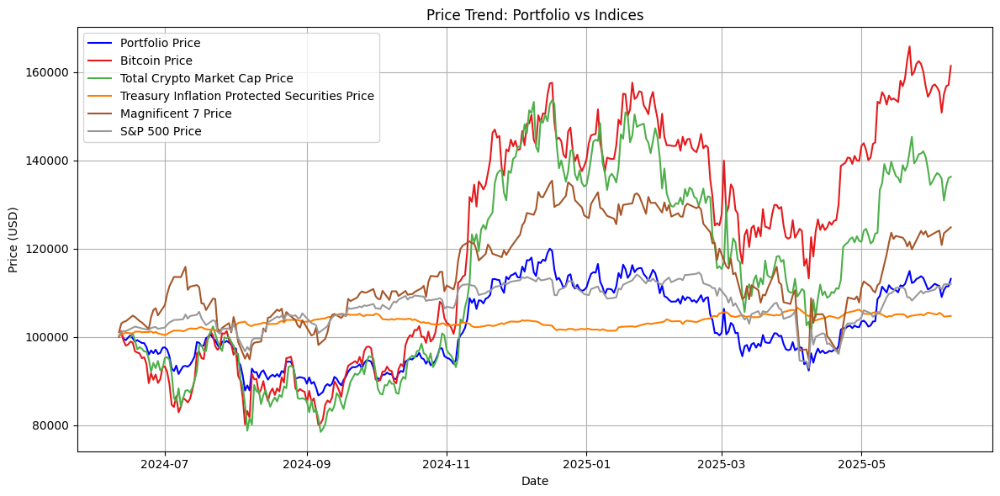

In [67]:
plot_price(portfolio_1_df, index_dict)

### Portfolio Returns visualization

/var/folders/5r/1lsvb2gx50n91j4gfq7gvff80000gn/T/ipykernel_1245/4705473.py:15: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = cm.get_cmap('Set1', len(index_dict))


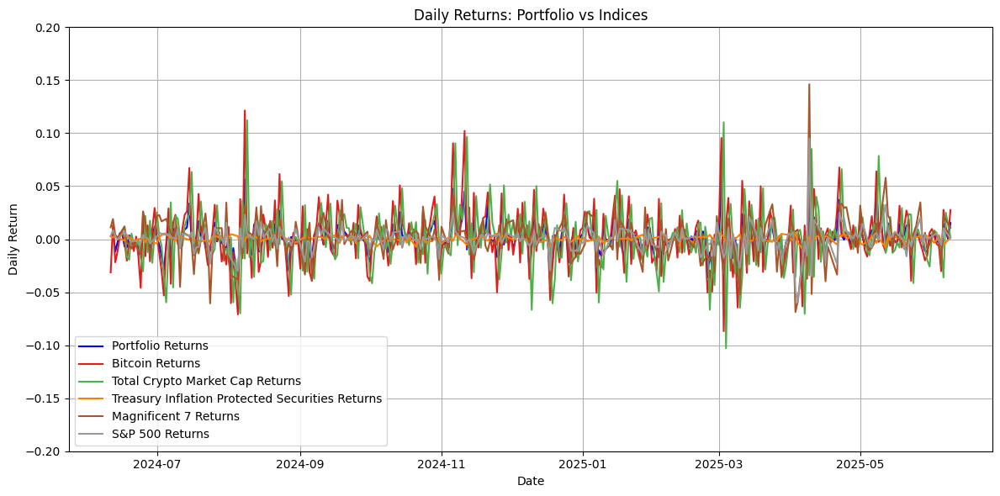

In [75]:
plot_returns(portfolio_1_df, index_dict)

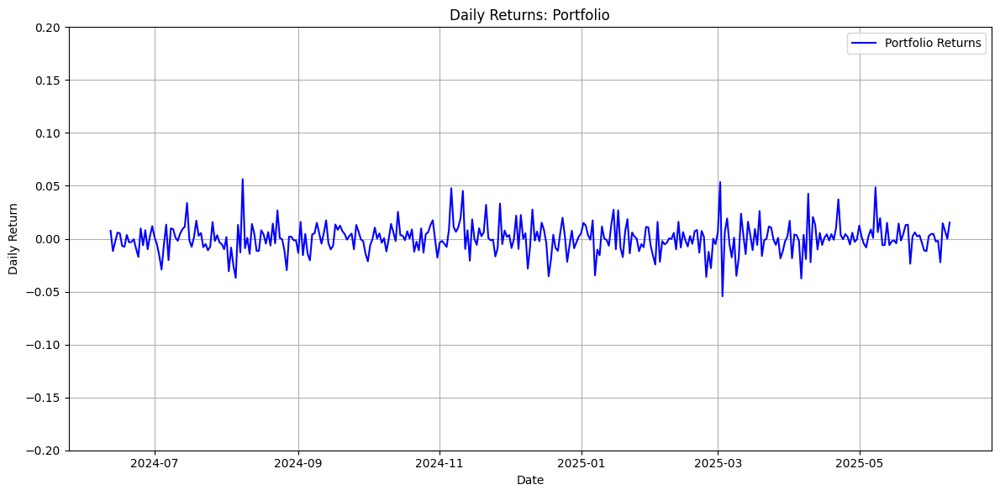

In [76]:
plot_returns(portfolio_1_df)

After Portfolio 1, all volatility scores and Asset Quality for the coins are calculated at the end of the notebook

<h3 style="text-align: center;"><strong>Balanced Portfolio</strong></h3>

<ul>
<li>USDC: 30%</li>
<li>BTC: 20%</li>
<li>ETH: 20%</li>
<li>ADA: 15%</li>
<li>SOL: 15%</li>
</ul>

In [77]:
"""building on coin_dict:"""
ADA_data = fetch_price('ADA', period='1y')
SOL_data = fetch_price('SOL', period='1y')
coin_dict['ADA'] = ADA_data
coin_dict['SOL'] = SOL_data

In [78]:
portfolio_2 = build_portfolio(coin_dict, [0.3, 0.2, 0.2, 0.15, 0.15], investment_amount=100000)

 Portfolio Breakdown:
 - USDC:
    Price: $1.00
    Allocation: $30,000.00
    Total USDC Purchased: 29,997.539722
 - BTC:
    Price: $67,332.03
    Allocation: $20,000.00
    Total BTC Purchased: 0.297035
 - ETH:
    Price: $3,498.33
    Allocation: $20,000.00
    Total ETH Purchased: 5.717013
 - ADA:
    Price: $0.42
    Allocation: $15,000.00
    Total ADA Purchased: 35,554.206805
 - SOL:
    Price: $149.43
    Allocation: $15,000.00
    Total SOL Purchased: 100.382131
Total Amount Invested: $100,000.00


<h3>Portfolio Data</h3>

In [79]:
portfolio_2_df = build_portfolio_time_series(coin_dict, portfolio_2)
portfolio_2_df

,Close,returns
Date,,
2024-06-12,101759.735176,0.017597
2024-06-13,99422.635668,-0.022967
2024-06-14,98500.899321,-0.009271
2024-06-15,99350.751091,0.008628
2024-06-16,100463.931858,0.011205
...,...,...
2025-06-05,110807.151614,-0.037154
2025-06-06,113348.115372,0.022931
2025-06-07,114521.987716,0.010356


<h3>Volatility Score</h3>

In [114]:
portfolio_2_vol_score_btc = calculate_volatility_score_portfolio(portfolio_2_df, total_data_index, rel_vol_weight=1, beta_weight=1)
portfolio_2_vol_score_total = calculate_volatility_score_portfolio(portfolio_2_df, btc_data_index, rel_vol_weight=1, beta_weight=1)
portfolio_2_vol_score_sp500 = calculate_volatility_score_portfolio(portfolio_2_df, sp500_data, rel_vol_weight=1, beta_weight=1)
portfolio_2_vol_score_mag7 = calculate_volatility_score_portfolio(portfolio_2_df, mag7_data, rel_vol_weight=1, beta_weight=1)

portfolio_2_vol_df = pd.DataFrame({
    'Portfolio': ['Portfolio 2: Balanced Portfolio'],
    'Volatility_Score_BTC': [portfolio_2_vol_score_btc],
    'Volatility_Score_Total': [portfolio_2_vol_score_total],
    'Volatility_Score_SP500': [portfolio_2_vol_score_sp500],
    'Volatility_Score_MAG7': [portfolio_2_vol_score_mag7]
})  
portfolio_vol_scores_df = pd.concat([portfolio_1_vol_df, portfolio_2_vol_df], ignore_index=True)

portfolio_vol_scores_df

,Portfolio,Volatility_Score_BTC,Volatility_Score_Total,Volatility_Score_SP500,Volatility_Score_MAG7
0,Portfolio 1: Conservative Portfolio,0.375121,0.862535,2.429114,1.167003
1,Portfolio 2: Balanced Portfolio,0.773813,1.598558,4.719464,2.251840


### AQM Score:

In [117]:
AQM_portfolio_1_btc = calculate_AQM_portfolio(portfolio_2_df, btc_data_index)
AQM_portfolio_2_tip = calculate_AQM_portfolio(portfolio_2_df, tip_data)
AQM_portfolio_2_sp500 = calculate_AQM_portfolio(portfolio_2_df, sp500_data)

AQM_portfolio_2_df = pd.DataFrame({
    'Portfolio': ['Portfolio 2: Balanced Portfolio'],
    'AQM_Score_BTC': [AQM_portfolio_1_btc],
    'AQM_Score_TIP': [AQM_portfolio_2_tip],
    'AQM_Score_SP500': [AQM_portfolio_2_sp500]
})
AQM_portfolio_df = pd.concat([AQM_portfolio_df, AQM_portfolio_2_df], ignore_index=True)
AQM_portfolio_df

,Portfolio,AQM_Score_BTC,AQM_Score_TIP,AQM_Score_SP500
0,Portfolio 1: Conservative Portfolio,0.802406,0.076694,0.223354
1,Portfolio 2: Balanced Portfolio,0.694137,0.050633,0.208513


### Portfolio Price Visualization:

/var/folders/5r/1lsvb2gx50n91j4gfq7gvff80000gn/T/ipykernel_1245/4705473.py:46: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = cm.get_cmap('Set1', len(index_dict))


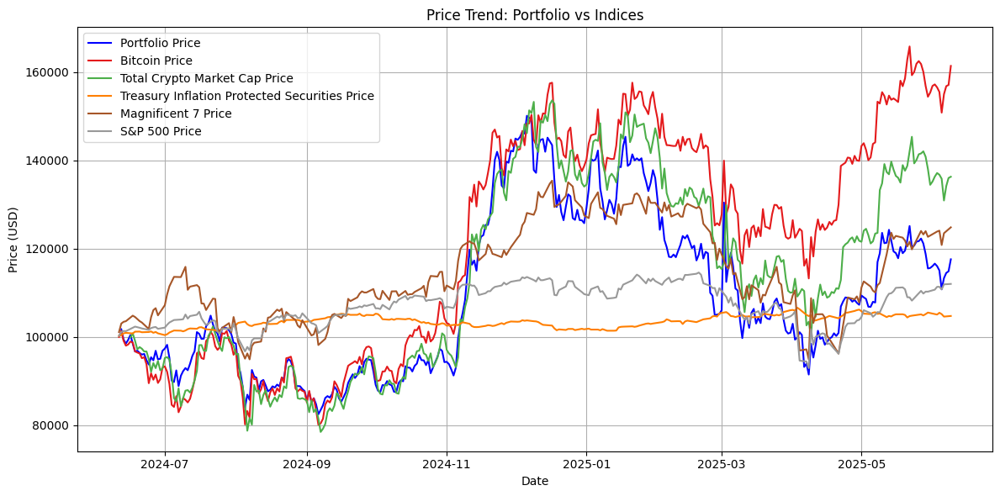

In [81]:
plot_price(portfolio_2_df, index_dict)

### Portfolio Returns Visualization

/var/folders/5r/1lsvb2gx50n91j4gfq7gvff80000gn/T/ipykernel_1245/4705473.py:15: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = cm.get_cmap('Set1', len(index_dict))


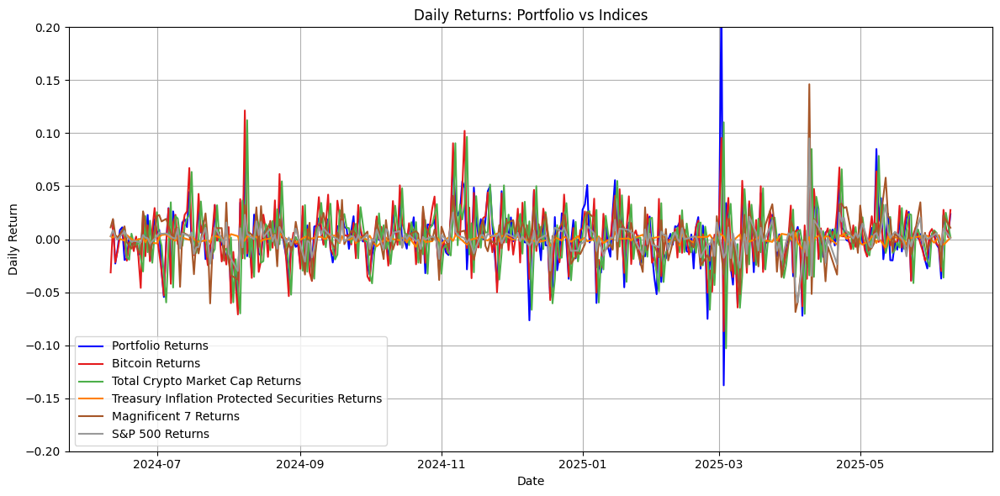

In [82]:
plot_returns(portfolio_2_df, index_dict)

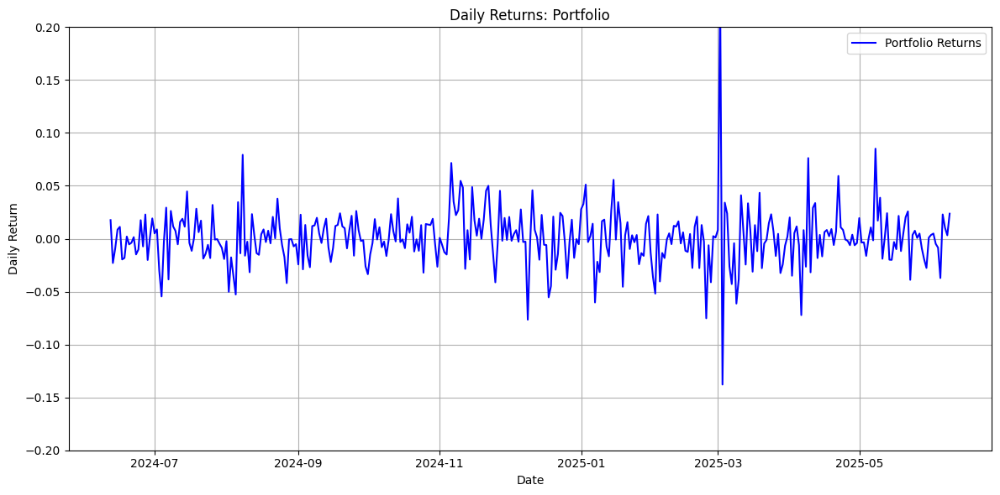

In [98]:
plot_returns(portfolio_2_df)

<h3 style="text-align: center;"><strong>Growth-Oriented Portfolio</strong></h3>

<ul>
<li>USDC: 10%</li>
<li>BTC: 25%</li>
<li>ETH: 20%</li>
<li>SOL: 20%</li>
<li>DOT: 15%</li>
<li>LINK: 10%</li>
</ul>

In [99]:
"""Building on coin_dict:"""
DOT_data = fetch_price('DOT', period='1y')
LINK_data = fetch_price('LINK', period='1y')

coin_dict['DOT'] = DOT_data
coin_dict['LINK'] = LINK_data
print(coin_dict.keys())

dict_keys(['USDC', 'BTC', 'ETH', 'ADA', 'SOL', 'DOT', 'LINK'])


In [100]:
portfolio_3 = build_portfolio(coin_dict, [0.1, 0.25, 0.20, 0, 0.20, 0.15, 0.1], investment_amount=100000)

 Portfolio Breakdown:
 - USDC:
    Price: $1.00
    Allocation: $10,000.00
    Total USDC Purchased: 9,999.179907
 - BTC:
    Price: $67,332.03
    Allocation: $25,000.00
    Total BTC Purchased: 0.371294
 - ETH:
    Price: $3,498.33
    Allocation: $20,000.00
    Total ETH Purchased: 5.717013
 - ADA:
    Price: $0.42
    Allocation: $0.00
    Total ADA Purchased: 0.000000
 - SOL:
    Price: $149.43
    Allocation: $20,000.00
    Total SOL Purchased: 133.842841
 - DOT:
    Price: $6.38
    Allocation: $15,000.00
    Total DOT Purchased: 2,351.135093
 - LINK:
    Price: $15.00
    Allocation: $10,000.00
    Total LINK Purchased: 666.829382
Total Amount Invested: $100,000.00


<h3>Portfolio Data</h3>

In [101]:
portfolio_3_df = build_portfolio_time_series(coin_dict, portfolio_3)
portfolio_3_df

,Close,returns
Date,,
2024-06-12,102977.089719,0.029771
2024-06-13,99382.894003,-0.034903
2024-06-14,97876.440750,-0.015158
2024-06-15,98957.757469,0.011048
2024-06-16,100773.169536,0.018345
...,...,...
2025-06-05,98487.152210,-0.043860
2025-06-06,100920.158628,0.024704
2025-06-07,102448.091967,0.015140


<h3> Volatility Score</h3>

In [115]:
portfolio_3_vol_score_btc = calculate_volatility_score_portfolio(portfolio_3_df, total_data_index, rel_vol_weight=1, beta_weight=1)
portfolio_3_vol_score_total = calculate_volatility_score_portfolio(portfolio_3_df, btc_data_index, rel_vol_weight=1, beta_weight=1)
portfolio_3_vol_score_sp500 = calculate_volatility_score_portfolio(portfolio_3_df, sp500_data, rel_vol_weight=1, beta_weight=1)
portfolio_3_vol_score_mag7 = calculate_volatility_score_portfolio(portfolio_3_df, mag7_data, rel_vol_weight=1, beta_weight=1)

portfolio_3_vol_df = pd.DataFrame({
    'Portfolio': ['Portfolio 3: Growth Portfolio'],
    'Volatility_Score_BTC': [portfolio_3_vol_score_btc],
    'Volatility_Score_Total': [portfolio_3_vol_score_total],
    'Volatility_Score_SP500': [portfolio_3_vol_score_sp500],
    'Volatility_Score_MAG7': [portfolio_3_vol_score_mag7]
})
portfolio_vol_scores_df = pd.concat([portfolio_vol_scores_df, portfolio_3_vol_df], ignore_index=True)
portfolio_vol_scores_df

,Portfolio,Volatility_Score_BTC,Volatility_Score_Total,Volatility_Score_SP500,Volatility_Score_MAG7
0,Portfolio 1: Conservative Portfolio,0.375121,0.862535,2.429114,1.167003
1,Portfolio 2: Balanced Portfolio,0.773813,1.598558,4.719464,2.251840
2,Portfolio 3: Growth Portfolio,0.750937,1.704959,4.756805,2.300040


### AQM Score:

In [118]:
AQM_portfolio_3_btc = calculate_AQM_portfolio(portfolio_3_df, btc_data_index)
AQM_portfolio_3_tip = calculate_AQM_portfolio(portfolio_3_df, tip_data)
AQM_portfolio_3_sp500 = calculate_AQM_portfolio(portfolio_3_df, sp500_data)

AQM_portfolio_3_df = pd.DataFrame({
    'Portfolio': ['Portfolio 3: Growth Portfolio'],
    'AQM_Score_BTC': [AQM_portfolio_3_btc],
    'AQM_Score_TIP': [AQM_portfolio_3_tip],
    'AQM_Score_SP500': [AQM_portfolio_3_sp500]
})
AQM_portfolio_df = pd.concat([AQM_portfolio_df, AQM_portfolio_3_df], ignore_index=True)
AQM_portfolio_df

,Portfolio,AQM_Score_BTC,AQM_Score_TIP,AQM_Score_SP500
0,Portfolio 1: Conservative Portfolio,0.802406,0.076694,0.223354
1,Portfolio 2: Balanced Portfolio,0.694137,0.050633,0.208513
2,Portfolio 3: Growth Portfolio,0.760495,0.053860,0.226042


### Portfolio Price Visualization:

/var/folders/5r/1lsvb2gx50n91j4gfq7gvff80000gn/T/ipykernel_1245/4705473.py:46: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = cm.get_cmap('Set1', len(index_dict))


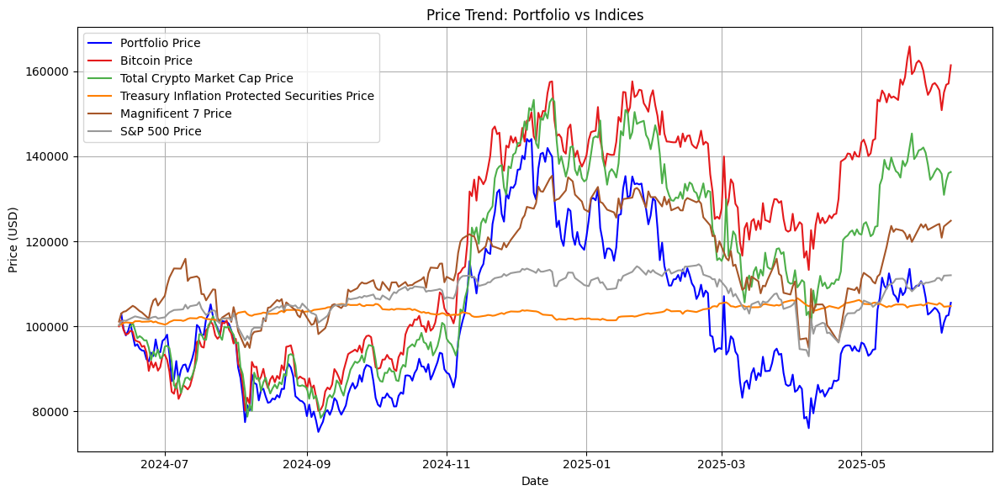

In [104]:
plot_price(portfolio_3_df, index_dict)

/var/folders/5r/1lsvb2gx50n91j4gfq7gvff80000gn/T/ipykernel_1245/4705473.py:15: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = cm.get_cmap('Set1', len(index_dict))


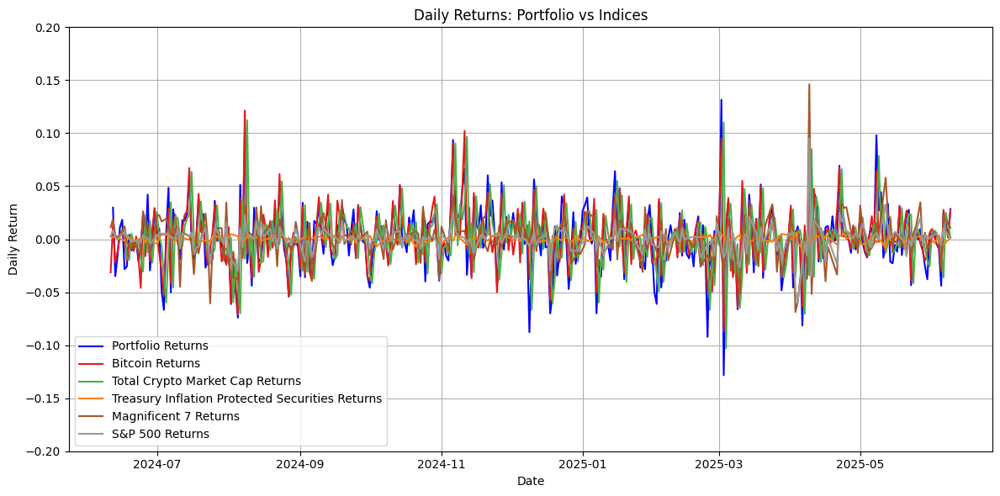

In [105]:
plot_returns(portfolio_3_df, index_dict)

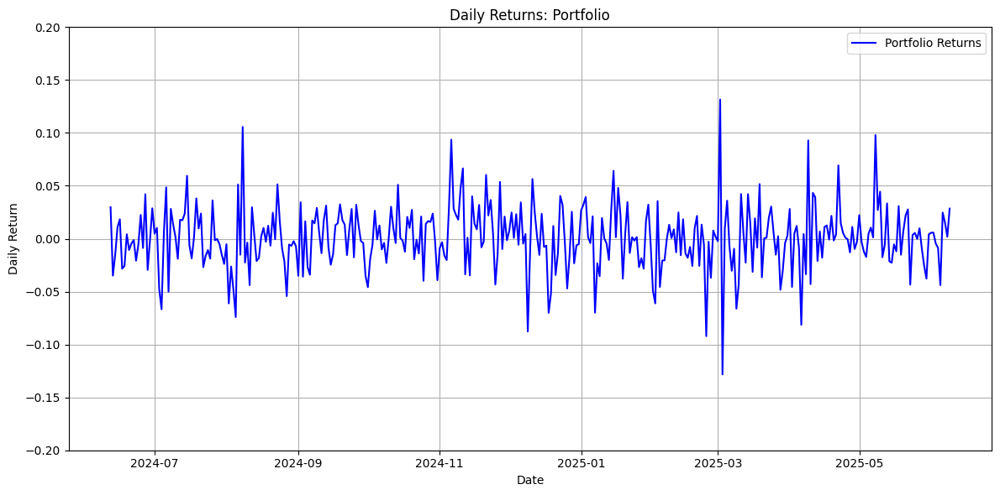

In [106]:
plot_returns(portfolio_3_df)

<h3 style="text-align: center;"><strong>High-Risk Portfolio</strong></h3>

- USDC: 5% 
- BTC: 20% 
- ETH: 15% 
- SOL: 20% 
- AVAX: 15% 
- DOGE: 10% 
- SHIB: 15%

In [107]:
"""building on coin_dict:"""
AVAX_data = fetch_price('AVAX', period='1y')
DOGE_data = fetch_price('DOGE', period='1y')
SHIB_data = fetch_price('SHIB', period='1y')
coin_dict['AVAX'] = AVAX_data
coin_dict['DOGE'] = DOGE_data
coin_dict['SHIB'] = SHIB_data
print(coin_dict.keys())

dict_keys(['USDC', 'BTC', 'ETH', 'ADA', 'SOL', 'DOT', 'LINK', 'AVAX', 'DOGE', 'SHIB'])


### Portfolio Data:

In [108]:
portfolio_4 = build_portfolio(coin_dict, [0.05, 0.20, 0.15, 0, 0.2, 0, 0, 0.15, 0.1, 0.15], investment_amount=100000)

 Portfolio Breakdown:
 - USDC:
    Price: $1.00
    Allocation: $5,000.00
    Total USDC Purchased: 4,999.589954
 - BTC:
    Price: $67,332.03
    Allocation: $20,000.00
    Total BTC Purchased: 0.297035
 - ETH:
    Price: $3,498.33
    Allocation: $15,000.00
    Total ETH Purchased: 4.287759
 - ADA:
    Price: $0.42
    Allocation: $0.00
    Total ADA Purchased: 0.000000
 - SOL:
    Price: $149.43
    Allocation: $20,000.00
    Total SOL Purchased: 133.842841
 - DOT:
    Price: $6.38
    Allocation: $0.00
    Total DOT Purchased: 0.000000
 - LINK:
    Price: $15.00
    Allocation: $0.00
    Total LINK Purchased: 0.000000
 - AVAX:
    Price: $31.54
    Allocation: $15,000.00
    Total AVAX Purchased: 475.564312
 - DOGE:
    Price: $0.14
    Allocation: $10,000.00
    Total DOGE Purchased: 72,409.195379
 - SHIB:
    Price: $0.00
    Allocation: $15,000.00
    Total SHIB Purchased: 681,818,176.492903
Total Amount Invested: $100,000.00


In [109]:
portfolio_4_df = build_portfolio_time_series(coin_dict, portfolio_4)
portfolio_4_df

,Close,returns
Date,,
2024-06-12,102711.283371,0.027113
2024-06-13,98687.684934,-0.039174
2024-06-14,96496.358416,-0.022205
2024-06-15,97879.494545,0.014334
2024-06-16,99063.865824,0.012100
...,...,...
2025-06-05,94426.273720,-0.054733
2025-06-06,96919.840275,0.026408
2025-06-07,99401.492308,0.025605


<h3> Volatility Score</h3>

In [119]:
portfolio_4_vol_score_btc = calculate_volatility_score_portfolio(portfolio_4_df, total_data_index, rel_vol_weight=1, beta_weight=1)
portfolio_4_vol_score_total = calculate_volatility_score_portfolio(portfolio_4_df, btc_data_index, rel_vol_weight=1, beta_weight=1)
portfolio_4_vol_score_sp500 = calculate_volatility_score_portfolio(portfolio_4_df, sp500_data, rel_vol_weight=1, beta_weight=1)
portfolio_4_vol_score_mag7 = calculate_volatility_score_portfolio(portfolio_4_df, mag7_data, rel_vol_weight=1, beta_weight=1)

portfolio_4_vol_df = pd.DataFrame({
    'Portfolio': ['Portfolio 4: High-Risk Portfolio'],
    'Volatility_Score_BTC': [portfolio_4_vol_score_btc],
    'Volatility_Score_Total': [portfolio_4_vol_score_total],
    'Volatility_Score_SP500': [portfolio_4_vol_score_sp500],
    'Volatility_Score_MAG7': [portfolio_4_vol_score_mag7]
})
portfolio_vol_scores_df = pd.concat([portfolio_vol_scores_df, portfolio_4_vol_df], ignore_index=True)
portfolio_vol_scores_df

,Portfolio,Volatility_Score_BTC,Volatility_Score_Total,Volatility_Score_SP500,Volatility_Score_MAG7
0,Portfolio 1: Conservative Portfolio,0.375121,0.862535,2.429114,1.167003
1,Portfolio 2: Balanced Portfolio,0.773813,1.598558,4.719464,2.251840
2,Portfolio 3: Growth Portfolio,0.750937,1.704959,4.756805,2.300040
3,Portfolio 4: High-Risk Portfolio,1.059213,2.099788,6.112758,2.914623


### AQM Score:

In [120]:
AQM_portfolio_4_btc = calculate_AQM_portfolio(portfolio_4_df, btc_data_index)
AQM_portfolio_4_tip = calculate_AQM_portfolio(portfolio_4_df, tip_data)
AQM_portfolio_4_sp500 = calculate_AQM_portfolio(portfolio_4_df, sp500_data)

AQM_portfolio_4_df = pd.DataFrame({
    'Portfolio': ['Portfolio 4: High-Risk Portfolio'],
    'AQM_Score_BTC': [AQM_portfolio_4_btc],
    'AQM_Score_TIP': [AQM_portfolio_4_tip],
    'AQM_Score_SP500': [AQM_portfolio_4_sp500]
})
AQM_portfolio_df = pd.concat([AQM_portfolio_df, AQM_portfolio_4_df], ignore_index=True)
AQM_portfolio_df

,Portfolio,AQM_Score_BTC,AQM_Score_TIP,AQM_Score_SP500
0,Portfolio 1: Conservative Portfolio,0.802406,0.076694,0.223354
1,Portfolio 2: Balanced Portfolio,0.694137,0.050633,0.208513
2,Portfolio 3: Growth Portfolio,0.760495,0.053860,0.226042
3,Portfolio 4: High-Risk Portfolio,0.764276,0.056679,0.213962


### Portfolio Price Visualization

/var/folders/5r/1lsvb2gx50n91j4gfq7gvff80000gn/T/ipykernel_1245/4705473.py:46: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = cm.get_cmap('Set1', len(index_dict))


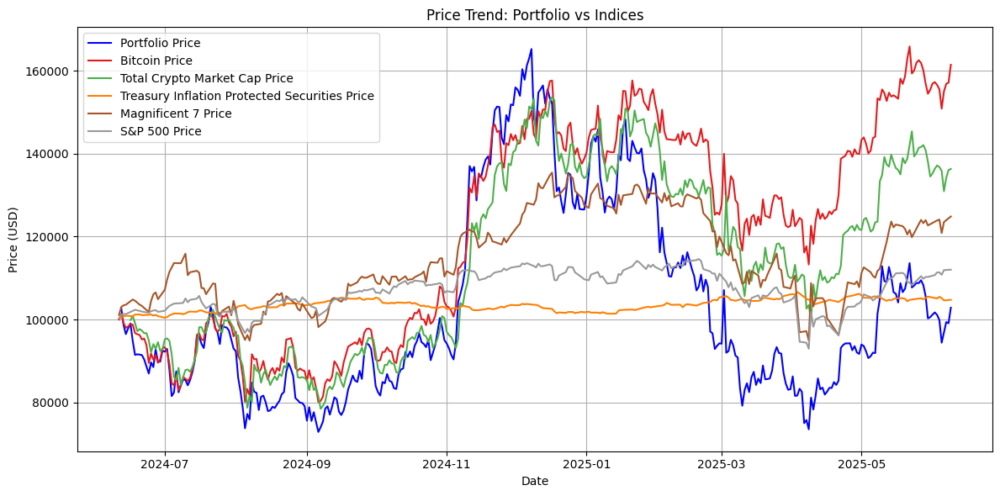

In [121]:
plot_price(portfolio_4_df, index_dict)

### Portfolio Returns Visualization

/var/folders/5r/1lsvb2gx50n91j4gfq7gvff80000gn/T/ipykernel_1245/4705473.py:15: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = cm.get_cmap('Set1', len(index_dict))


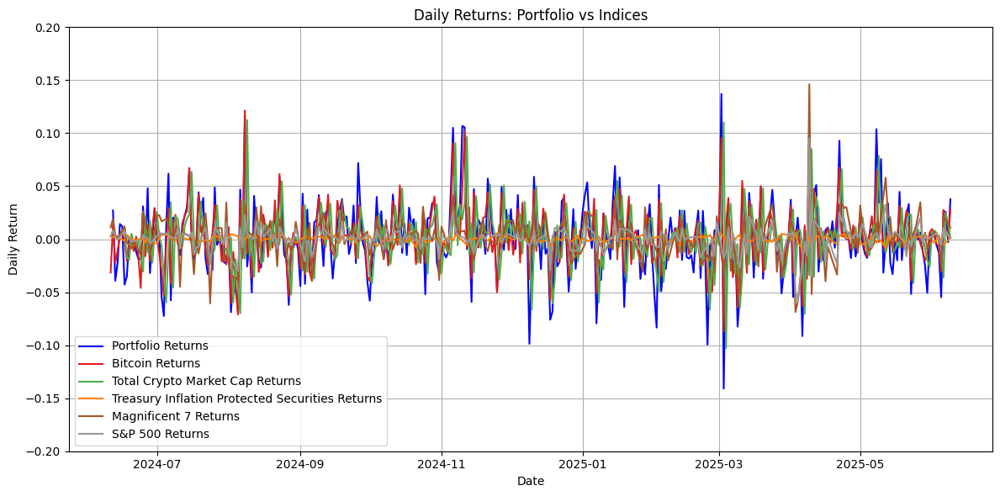

In [122]:
plot_returns(portfolio_4_df, index_dict)

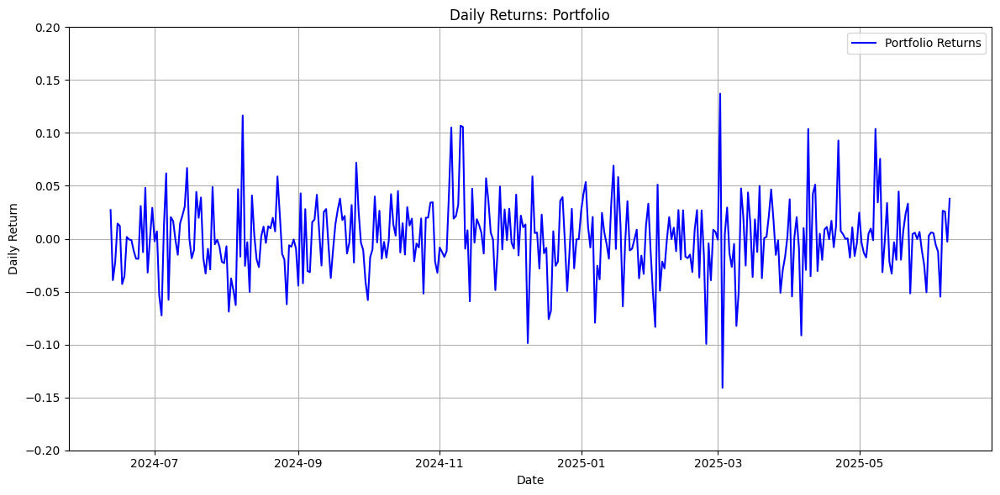

In [123]:
plot_returns(portfolio_4_df)

<h3 style="text-align: center;"><strong>Meme-coin Heavy Portfolio</strong></h3>

- USDC: 10%  
- BTC: 20% 
- ETH: 10% 
- DOGE: 30%
- SHIB: 30%

In [124]:
print(coin_dict.keys())

dict_keys(['USDC', 'BTC', 'ETH', 'ADA', 'SOL', 'DOT', 'LINK', 'AVAX', 'DOGE', 'SHIB'])


In [125]:
#no new coin data to fetch
portfolio_5 = build_portfolio(coin_dict, [0.1, 0.2, 0.1, 0, 0, 0, 0, 0, 0.3, 0.3])


 Portfolio Breakdown:
 - USDC:
    Price: $1.00
    Allocation: $10,000.00
    Total USDC Purchased: 9,999.179907
 - BTC:
    Price: $67,332.03
    Allocation: $20,000.00
    Total BTC Purchased: 0.297035
 - ETH:
    Price: $3,498.33
    Allocation: $10,000.00
    Total ETH Purchased: 2.858506
 - ADA:
    Price: $0.42
    Allocation: $0.00
    Total ADA Purchased: 0.000000
 - SOL:
    Price: $149.43
    Allocation: $0.00
    Total SOL Purchased: 0.000000
 - DOT:
    Price: $6.38
    Allocation: $0.00
    Total DOT Purchased: 0.000000
 - LINK:
    Price: $15.00
    Allocation: $0.00
    Total LINK Purchased: 0.000000
 - AVAX:
    Price: $31.54
    Allocation: $0.00
    Total AVAX Purchased: 0.000000
 - DOGE:
    Price: $0.14
    Allocation: $30,000.00
    Total DOGE Purchased: 217,227.586137
 - SHIB:
    Price: $0.00
    Allocation: $30,000.00
    Total SHIB Purchased: 1,363,636,352.985805
Total Amount Invested: $100,000.00


In [126]:
portfolio_5_df = build_portfolio_time_series(coin_dict, portfolio_5)
portfolio_5_df

,Close,returns
Date,,
2024-06-12,102201.963899,0.022020
2024-06-13,99023.484510,-0.031100
2024-06-14,96146.386274,-0.029055
2024-06-15,98155.484514,0.020896
2024-06-16,98525.301478,0.003768
...,...,...
2025-06-05,100724.309359,-0.060233
2025-06-06,103327.719751,0.025847
2025-06-07,106541.705837,0.031105


### Volatility Score:

In [127]:
portfolio_5_score_btc = calculate_volatility_score_portfolio(portfolio_5_df, total_data_index, rel_vol_weight=1, beta_weight=1)
portfolio_5_score_total = calculate_volatility_score_portfolio(portfolio_5_df, btc_data_index, rel_vol_weight=1, beta_weight=1)
portfolio_5_score_sp500 = calculate_volatility_score_portfolio(portfolio_5_df, sp500_data, rel_vol_weight=1, beta_weight=1)
portfolio_5_score_mag7 = calculate_volatility_score_portfolio(portfolio_5_df, mag7_data, rel_vol_weight=1, beta_weight=1)

portfolio_5_vol_df = pd.DataFrame({
    'Portfolio': ['Portfolio 5: Memecoin heavy Portfolio'],
    'Volatility_Score_BTC': [portfolio_5_score_btc],
    'Volatility_Score_Total': [portfolio_5_score_total],
    'Volatility_Score_SP500': [portfolio_5_score_sp500],
    'Volatility_Score_MAG7': [portfolio_5_score_mag7]
})
portfolio_vol_scores_df = pd.concat([portfolio_vol_scores_df, portfolio_5_vol_df], ignore_index=True)
portfolio_vol_scores_df

,Portfolio,Volatility_Score_BTC,Volatility_Score_Total,Volatility_Score_SP500,Volatility_Score_MAG7
0,Portfolio 1: Conservative Portfolio,0.375121,0.862535,2.429114,1.167003
1,Portfolio 2: Balanced Portfolio,0.773813,1.598558,4.719464,2.251840
2,Portfolio 3: Growth Portfolio,0.750937,1.704959,4.756805,2.300040
3,Portfolio 4: High-Risk Portfolio,1.059213,2.099788,6.112758,2.914623
4,Portfolio 5: Memecoin heavy Portfolio,1.513586,2.460068,7.951783,3.715549


### AQM Score:

In [129]:
AQM_portfolio_5_btc = calculate_AQM_portfolio(portfolio_5_df, btc_data_index)
AQM_portfolio_5_tip = calculate_AQM_portfolio(portfolio_5_df, tip_data)
AQM_portfolio_5_sp500 = calculate_AQM_portfolio(portfolio_5_df, sp500_data)

AQM_portfolio_5_df = pd.DataFrame({
    'Portfolio': ['Portfolio 5: Memecoin heavy Portfolio'],
    'AQM_Score_BTC': [AQM_portfolio_5_btc],
    'AQM_Score_TIP': [AQM_portfolio_5_tip],
    'AQM_Score_SP500': [AQM_portfolio_5_sp500]
})
AQM_portfolio_df = pd.concat([AQM_portfolio_df, AQM_portfolio_5_df], ignore_index=True)
AQM_portfolio_df

,Portfolio,AQM_Score_BTC,AQM_Score_TIP,AQM_Score_SP500
0,Portfolio 1: Conservative Portfolio,0.802406,0.076694,0.223354
1,Portfolio 2: Balanced Portfolio,0.694137,0.050633,0.208513
2,Portfolio 3: Growth Portfolio,0.760495,0.053860,0.226042
3,Portfolio 4: High-Risk Portfolio,0.764276,0.056679,0.213962
4,Portfolio 5: Memecoin heavy Portfolio,0.691626,0.061425,0.181969


### Portfolio Price Visualization

/var/folders/5r/1lsvb2gx50n91j4gfq7gvff80000gn/T/ipykernel_1245/4705473.py:46: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = cm.get_cmap('Set1', len(index_dict))


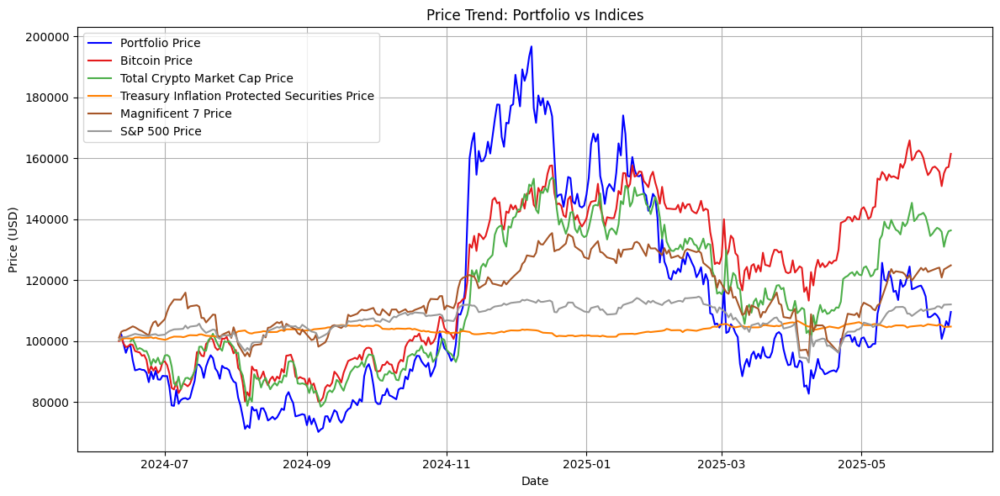

In [128]:
plot_price(portfolio_5_df, index_dict)

### Portfolio Return Visualization

/var/folders/5r/1lsvb2gx50n91j4gfq7gvff80000gn/T/ipykernel_1020/4180322575.py:12: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = cm.get_cmap('Set1', len(index_dict))


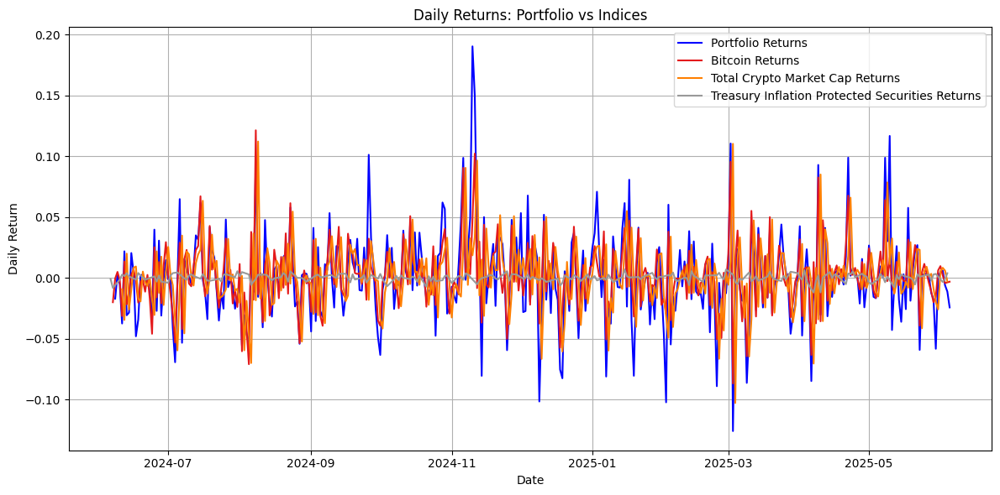

In [322]:
plot_returns(portfolio_5_df, index_dict)

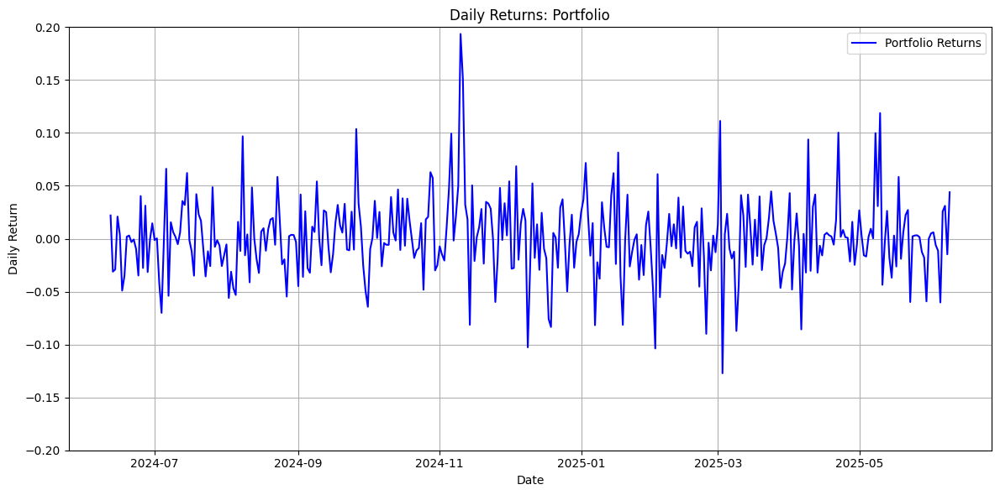

In [130]:
plot_returns(portfolio_5_df)

<h3 style="text-align: center;"><strong>De-Fi Focused Portfolio</strong></h3>

- USDC: 20% 
- ETH: 25% 
- UNI: 25% 
- AAVE: 20%
- COMP: 10%

In [131]:
UNI_data = fetch_price('UNI7083', period='1y')
AAVE_data = fetch_price('AAVE', period='1y')
COMP_data = fetch_price('COMP5692', period='1y')
coin_dict['UNI'] = UNI_data
coin_dict['AAVE'] = AAVE_data
coin_dict['COMP'] = COMP_data
print(coin_dict.keys())

dict_keys(['USDC', 'BTC', 'ETH', 'ADA', 'SOL', 'DOT', 'LINK', 'AVAX', 'DOGE', 'SHIB', 'UNI', 'AAVE', 'COMP'])


In [132]:
portfolio_6 = build_portfolio(coin_dict, [0.2, 0, 0.25, 0, 0, 0, 0, 0, 0, 0, 0.25, 0.2, 0.1], investment_amount=100000)

 Portfolio Breakdown:
 - USDC:
    Price: $1.00
    Allocation: $20,000.00
    Total USDC Purchased: 19,998.359815
 - BTC:
    Price: $67,332.03
    Allocation: $0.00
    Total BTC Purchased: 0.000000
 - ETH:
    Price: $3,498.33
    Allocation: $25,000.00
    Total ETH Purchased: 7.146266
 - ADA:
    Price: $0.42
    Allocation: $0.00
    Total ADA Purchased: 0.000000
 - SOL:
    Price: $149.43
    Allocation: $0.00
    Total SOL Purchased: 0.000000
 - DOT:
    Price: $6.38
    Allocation: $0.00
    Total DOT Purchased: 0.000000
 - LINK:
    Price: $15.00
    Allocation: $0.00
    Total LINK Purchased: 0.000000
 - AVAX:
    Price: $31.54
    Allocation: $0.00
    Total AVAX Purchased: 0.000000
 - DOGE:
    Price: $0.14
    Allocation: $0.00
    Total DOGE Purchased: 0.000000
 - SHIB:
    Price: $0.00
    Allocation: $0.00
    Total SHIB Purchased: 0.000000
 - UNI:
    Price: $8.98
    Allocation: $25,000.00
    Total UNI Purchased: 2,782.466926
 - AAVE:
    Price: $87.74
    Allocatio

In [133]:
portfolio_6_df = build_portfolio_time_series(coin_dict, portfolio_6)
portfolio_6_df

,Close,returns
Date,,
2024-06-12,104298.565563,0.042986
2024-06-13,102062.005746,-0.021444
2024-06-14,102889.202032,0.008105
2024-06-15,107380.568068,0.043652
2024-06-16,109051.252867,0.015559
...,...,...
2025-06-05,117063.722787,-0.064498
2025-06-06,120145.998253,0.026330
2025-06-07,123218.669859,0.025574


### Volatility Score:

In [134]:
portfolio_6_vol_score_btc = calculate_volatility_score_portfolio(portfolio_6_df, total_data_index, rel_vol_weight=1, beta_weight=1)
portfolio_6_vol_score_total = calculate_volatility_score_portfolio(portfolio_6_df, btc_data_index, rel_vol_weight=1, beta_weight=1)
portfolio_6_vol_score_sp500 = calculate_volatility_score_portfolio(portfolio_6_df, sp500_data, rel_vol_weight=1, beta_weight=1)
portfolio_6_vol_score_mag7 = calculate_volatility_score_portfolio(portfolio_6_df, mag7_data, rel_vol_weight=1, beta_weight=1)

portfolio_6_vol_df = pd.DataFrame({
    'Portfolio': ['Portfolio 6: DeFi Portfolio'],
    'Volatility_Score_BTC': [portfolio_6_vol_score_btc],
    'Volatility_Score_Total': [portfolio_6_vol_score_total],
    'Volatility_Score_SP500': [portfolio_6_vol_score_sp500],
    'Volatility_Score_MAG7': [portfolio_6_vol_score_mag7]
})
portfolio_vol_scores_df = pd.concat([portfolio_vol_scores_df, portfolio_6_vol_df], ignore_index=True)
portfolio_vol_scores_df

,Portfolio,Volatility_Score_BTC,Volatility_Score_Total,Volatility_Score_SP500,Volatility_Score_MAG7
0,Portfolio 1: Conservative Portfolio,0.375121,0.862535,2.429114,1.167003
1,Portfolio 2: Balanced Portfolio,0.773813,1.598558,4.719464,2.251840
2,Portfolio 3: Growth Portfolio,0.750937,1.704959,4.756805,2.300040
3,Portfolio 4: High-Risk Portfolio,1.059213,2.099788,6.112758,2.914623
4,Portfolio 5: Memecoin heavy Portfolio,1.513586,2.460068,7.951783,3.715549
5,Portfolio 6: DeFi Portfolio,1.118940,2.164743,7.450628,3.536236


### AQM Score:

In [135]:
AQM_portfolio_6_btc = calculate_AQM_portfolio(portfolio_6_df, btc_data_index)
AQM_portfolio_6_tip = calculate_AQM_portfolio(portfolio_6_df, tip_data)
AQM_portfolio_6_sp500 = calculate_AQM_portfolio(portfolio_6_df, sp500_data)

AQM_portfolio_6_df = pd.DataFrame({
    'Portfolio': ['Portfolio 6: DeFi Portfolio'],
    'AQM_Score_BTC': [AQM_portfolio_6_btc],
    'AQM_Score_TIP': [AQM_portfolio_6_tip],
    'AQM_Score_SP500': [AQM_portfolio_6_sp500]
})
AQM_portfolio_df = pd.concat([AQM_portfolio_df, AQM_portfolio_6_df], ignore_index=True)

In [136]:
AQM_portfolio_df

,Portfolio,AQM_Score_BTC,AQM_Score_TIP,AQM_Score_SP500
0,Portfolio 1: Conservative Portfolio,0.802406,0.076694,0.223354
1,Portfolio 2: Balanced Portfolio,0.694137,0.050633,0.208513
2,Portfolio 3: Growth Portfolio,0.760495,0.053860,0.226042
3,Portfolio 4: High-Risk Portfolio,0.764276,0.056679,0.213962
4,Portfolio 5: Memecoin heavy Portfolio,0.691626,0.061425,0.181969
5,Portfolio 6: DeFi Portfolio,0.496308,0.141103,0.280672


### Portfolio Price Visualization

/var/folders/5r/1lsvb2gx50n91j4gfq7gvff80000gn/T/ipykernel_1245/4705473.py:46: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = cm.get_cmap('Set1', len(index_dict))


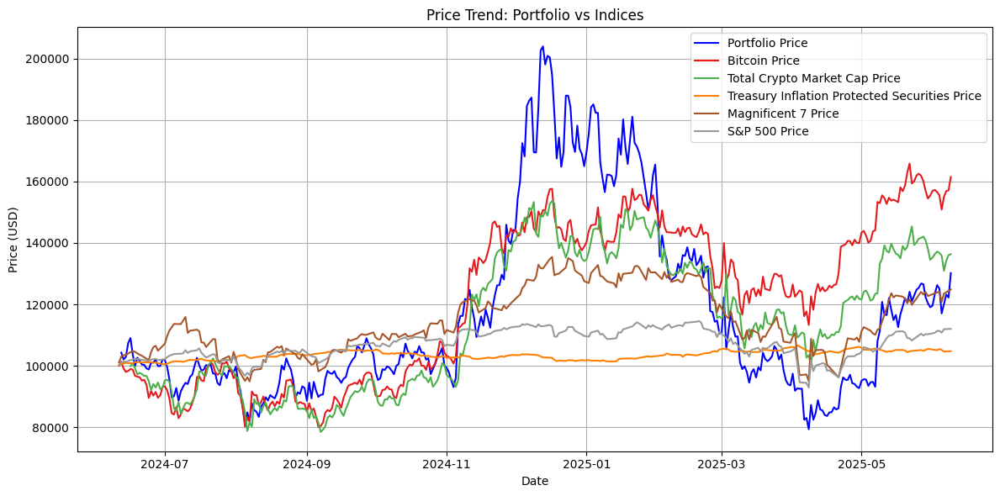

In [137]:
plot_price(portfolio_6_df, index_dict)

### Portfolio Returns Visualization

/var/folders/5r/1lsvb2gx50n91j4gfq7gvff80000gn/T/ipykernel_1245/4705473.py:15: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = cm.get_cmap('Set1', len(index_dict))


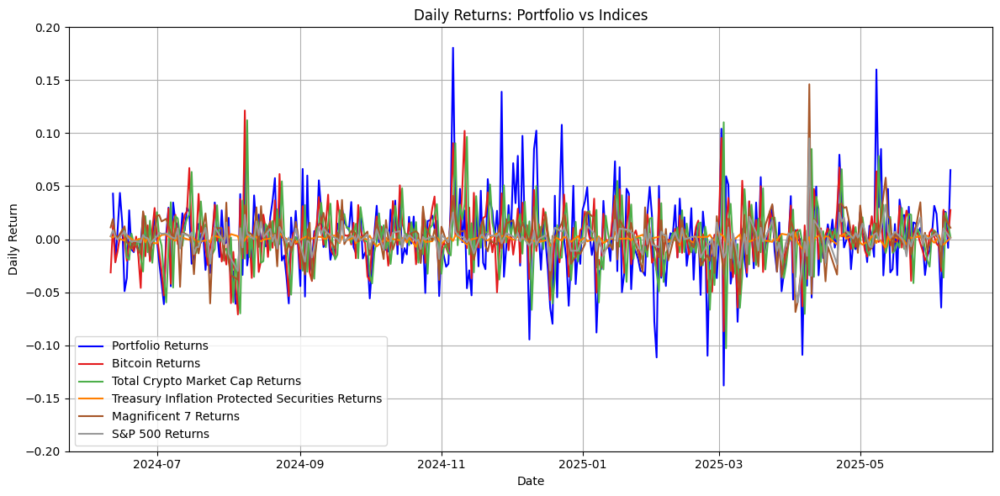

In [138]:
plot_returns(portfolio_6_df, index_dict)

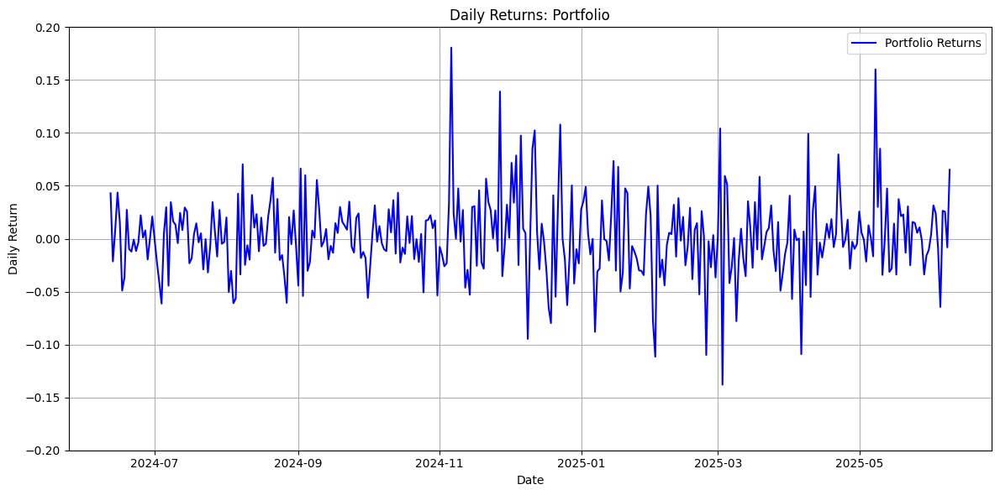

In [139]:
plot_returns(portfolio_6_df)

<h3 style="text-align: center;"><strong>NFT/ Metaverse Portfolio</strong></h3>

- USDC: 10% 
- ETH: 25% 
- SOL: 20% 
- MANA: 15% 
- SAND: 15% 
- ENJ: 15% 

In [140]:
MANA_data = fetch_price('MANA', period='1y')
SAND_data = fetch_price('SAND', period='1y')
ENJ_data = fetch_price('ENJ', period='1y')
coin_dict['MANA'] = MANA_data
coin_dict['SAND'] = SAND_data
coin_dict['ENJ'] = ENJ_data
print(coin_dict.keys())

dict_keys(['USDC', 'BTC', 'ETH', 'ADA', 'SOL', 'DOT', 'LINK', 'AVAX', 'DOGE', 'SHIB', 'UNI', 'AAVE', 'COMP', 'MANA', 'SAND', 'ENJ'])


In [141]:
portfolio_7 = build_portfolio(coin_dict, [0.1, 0, 0.25, 0, 0.2, 0, 0, 0, 0, 0, 0, 0, 0, 0.15, 0.15, 0.15], investment_amount=100000)

 Portfolio Breakdown:
 - USDC:
    Price: $1.00
    Allocation: $10,000.00
    Total USDC Purchased: 9,999.179907
 - BTC:
    Price: $67,332.03
    Allocation: $0.00
    Total BTC Purchased: 0.000000
 - ETH:
    Price: $3,498.33
    Allocation: $25,000.00
    Total ETH Purchased: 7.146266
 - ADA:
    Price: $0.42
    Allocation: $0.00
    Total ADA Purchased: 0.000000
 - SOL:
    Price: $149.43
    Allocation: $20,000.00
    Total SOL Purchased: 133.842841
 - DOT:
    Price: $6.38
    Allocation: $0.00
    Total DOT Purchased: 0.000000
 - LINK:
    Price: $15.00
    Allocation: $0.00
    Total LINK Purchased: 0.000000
 - AVAX:
    Price: $31.54
    Allocation: $0.00
    Total AVAX Purchased: 0.000000
 - DOGE:
    Price: $0.14
    Allocation: $0.00
    Total DOGE Purchased: 0.000000
 - SHIB:
    Price: $0.00
    Allocation: $0.00
    Total SHIB Purchased: 0.000000
 - UNI:
    Price: $8.98
    Allocation: $0.00
    Total UNI Purchased: 0.000000
 - AAVE:
    Price: $87.74
    Allocation: 

In [142]:
portfolio_7_df = build_portfolio_time_series(coin_dict, portfolio_7)
portfolio_7_df

,Close,returns
Date,,
2024-06-12,103000.526111,0.030005
2024-06-13,99011.323626,-0.038730
2024-06-14,96735.653230,-0.022984
2024-06-15,98112.079489,0.014229
2024-06-16,99434.964804,0.013483
...,...,...
2025-06-05,70855.870038,-0.053408
2025-06-06,72723.273739,0.026355
2025-06-07,74293.576405,0.021593


### Volatility Score

In [143]:
portfolio_7_score_btc = calculate_volatility_score_portfolio(portfolio_7_df, total_data_index, rel_vol_weight=1, beta_weight=1)
portfolio_7_score_total = calculate_volatility_score_portfolio(portfolio_7_df, btc_data_index, rel_vol_weight=1, beta_weight=1)
portfolio_7_score_sp500 = calculate_volatility_score_portfolio(portfolio_7_df, sp500_data, rel_vol_weight=1, beta_weight=1)
portfolio_7_score_mag7 = calculate_volatility_score_portfolio(portfolio_7_df, mag7_data, rel_vol_weight=1, beta_weight=1)

portfolio_7_vol_df = pd.DataFrame({
    'Portfolio': ['Portfolio 7: NFT/Metaverse Portfolio'],
    'Volatility_Score_BTC': [portfolio_7_score_btc],
    'Volatility_Score_Total': [portfolio_7_score_total],
    'Volatility_Score_SP500': [portfolio_7_score_sp500],
    'Volatility_Score_MAG7': [portfolio_7_score_mag7]
})
portfolio_vol_scores_df = pd.concat([portfolio_vol_scores_df, portfolio_7_vol_df], ignore_index=True)
portfolio_vol_scores_df

,Portfolio,Volatility_Score_BTC,Volatility_Score_Total,Volatility_Score_SP500,Volatility_Score_MAG7
0,Portfolio 1: Conservative Portfolio,0.375121,0.862535,2.429114,1.167003
1,Portfolio 2: Balanced Portfolio,0.773813,1.598558,4.719464,2.251840
2,Portfolio 3: Growth Portfolio,0.750937,1.704959,4.756805,2.300040
3,Portfolio 4: High-Risk Portfolio,1.059213,2.099788,6.112758,2.914623
4,Portfolio 5: Memecoin heavy Portfolio,1.513586,2.460068,7.951783,3.715549
5,Portfolio 6: DeFi Portfolio,1.118940,2.164743,7.450628,3.536236
6,Portfolio 7: NFT/Metaverse Portfolio,0.951068,1.946735,5.645880,2.703595


### AQM Score:

In [144]:
AQM_portfolio_7_btc = calculate_AQM_portfolio(portfolio_7_df, btc_data_index)
AQM_portfolio_7_tip = calculate_AQM_portfolio(portfolio_7_df, tip_data)
AQM_portfolio_7_sp500 = calculate_AQM_portfolio(portfolio_7_df, sp500_data)

AQM_portfolio_7_df = pd.DataFrame({
    'Portfolio': ['Portfolio 7: NFT/Metaverse Portfolio'],
    'AQM_Score_BTC': [AQM_portfolio_7_btc],
    'AQM_Score_TIP': [AQM_portfolio_7_tip],
    'AQM_Score_SP500': [AQM_portfolio_7_sp500]
})
AQM_portfolio_df = pd.concat([AQM_portfolio_df, AQM_portfolio_7_df], ignore_index=True)
AQM_portfolio_df

,Portfolio,AQM_Score_BTC,AQM_Score_TIP,AQM_Score_SP500
0,Portfolio 1: Conservative Portfolio,0.802406,0.076694,0.223354
1,Portfolio 2: Balanced Portfolio,0.694137,0.050633,0.208513
2,Portfolio 3: Growth Portfolio,0.760495,0.053860,0.226042
3,Portfolio 4: High-Risk Portfolio,0.764276,0.056679,0.213962
4,Portfolio 5: Memecoin heavy Portfolio,0.691626,0.061425,0.181969
5,Portfolio 6: DeFi Portfolio,0.496308,0.141103,0.280672
6,Portfolio 7: NFT/Metaverse Portfolio,0.543359,0.004616,0.151545


### Portfolio Price Visualization

/var/folders/5r/1lsvb2gx50n91j4gfq7gvff80000gn/T/ipykernel_1245/4705473.py:46: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = cm.get_cmap('Set1', len(index_dict))


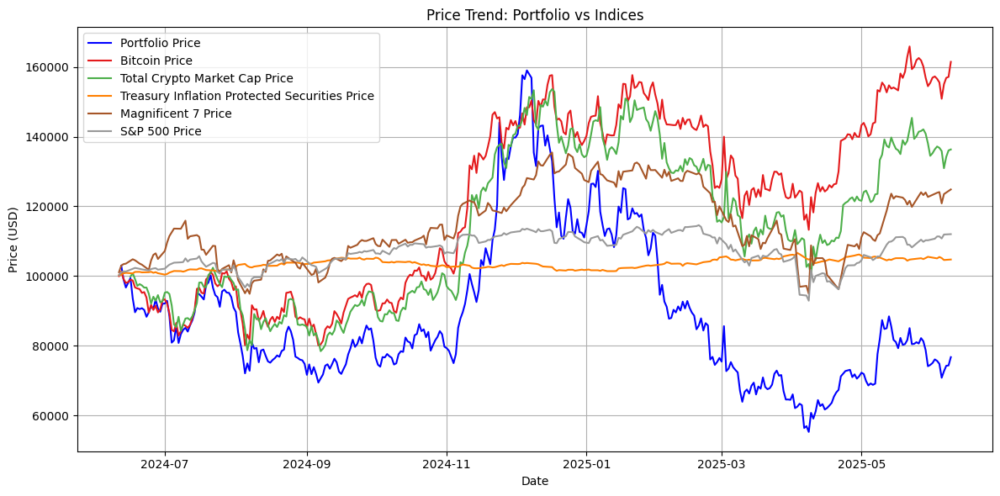

In [145]:
plot_price(portfolio_7_df, index_dict)

### Portfolio Returns Visualization

/var/folders/5r/1lsvb2gx50n91j4gfq7gvff80000gn/T/ipykernel_1245/4705473.py:15: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = cm.get_cmap('Set1', len(index_dict))


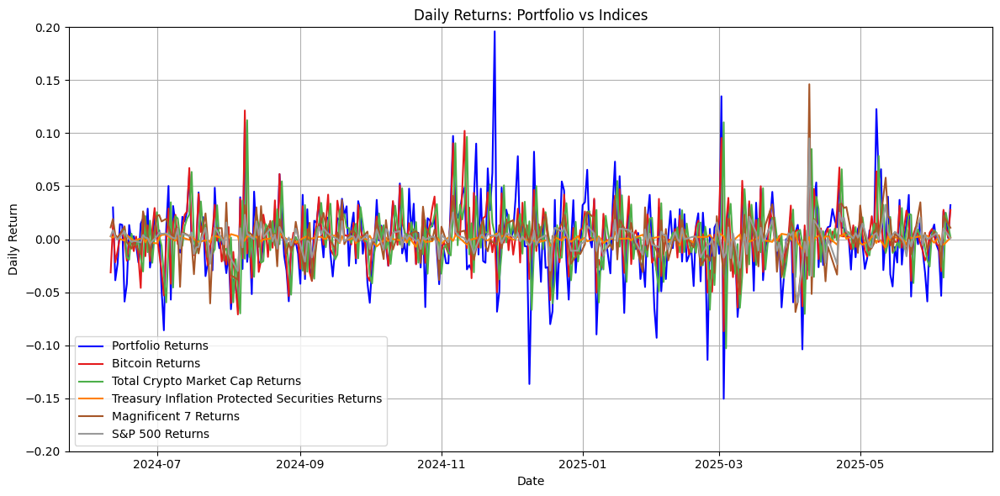

In [146]:
plot_returns(portfolio_7_df, index_dict)

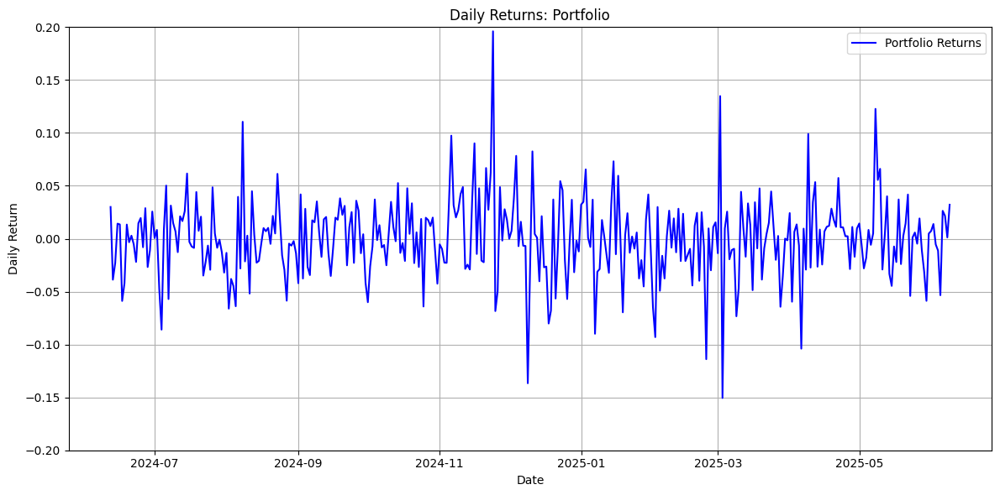

In [147]:
plot_returns(portfolio_7_df)

<h3 style="text-align: center;"><strong>Tech-Oriented Portfolio</strong></h3>


- USDC: 15% 
- ETH: 25% 
- ADA: 20% 
- DOT: 20% 
- ALGO: 10%
- XTZ: 10% 

In [149]:
ALGO_data = fetch_price('ALGO', period='1y')
XTZ_data = fetch_price('XTZ', period='1y')
coin_dict['ALGO'] = ALGO_data
coin_dict['XTZ'] = XTZ_data
print(coin_dict.keys())

dict_keys(['USDC', 'BTC', 'ETH', 'ADA', 'SOL', 'DOT', 'LINK', 'AVAX', 'DOGE', 'SHIB', 'UNI', 'AAVE', 'COMP', 'MANA', 'SAND', 'ENJ', 'ALGO', 'XTZ'])


### Portfolio Data:

In [150]:
portfolio_8 = build_portfolio(coin_dict, [0.15, 0, 0.25, 0.2, 0, 0.2, 0, 0, 0, 0, 0, 0, 0, 0 ,0, 0, 0.1, 0.1], investment_amount=100000)

 Portfolio Breakdown:
 - USDC:
    Price: $1.00
    Allocation: $15,000.00
    Total USDC Purchased: 14,998.769861
 - BTC:
    Price: $67,332.03
    Allocation: $0.00
    Total BTC Purchased: 0.000000
 - ETH:
    Price: $3,498.33
    Allocation: $25,000.00
    Total ETH Purchased: 7.146266
 - ADA:
    Price: $0.42
    Allocation: $20,000.00
    Total ADA Purchased: 47,405.609073
 - SOL:
    Price: $149.43
    Allocation: $0.00
    Total SOL Purchased: 0.000000
 - DOT:
    Price: $6.38
    Allocation: $20,000.00
    Total DOT Purchased: 3,134.846790
 - LINK:
    Price: $15.00
    Allocation: $0.00
    Total LINK Purchased: 0.000000
 - AVAX:
    Price: $31.54
    Allocation: $0.00
    Total AVAX Purchased: 0.000000
 - DOGE:
    Price: $0.14
    Allocation: $0.00
    Total DOGE Purchased: 0.000000
 - SHIB:
    Price: $0.00
    Allocation: $0.00
    Total SHIB Purchased: 0.000000
 - UNI:
    Price: $8.98
    Allocation: $0.00
    Total UNI Purchased: 0.000000
 - AAVE:
    Price: $87.74
   

In [151]:
portfolio_8_df = build_portfolio_time_series(coin_dict, portfolio_8)
portfolio_8_df

,Close,returns
Date,,
2024-06-12,103144.111710,0.031441
2024-06-13,99469.893336,-0.035622
2024-06-14,98185.062483,-0.012917
2024-06-15,99174.577172,0.010078
2024-06-16,100426.750065,0.012626
...,...,...
2025-06-05,92050.775345,-0.050042
2025-06-06,94594.947717,0.027639
2025-06-07,96208.895102,0.017062


### Volatility Score:

In [152]:
portfolio_8_vol_score_btc = calculate_volatility_score_portfolio(portfolio_8_df, total_data_index, rel_vol_weight=1, beta_weight=1)
portfolio_8_vol_score_total = calculate_volatility_score_portfolio(portfolio_8_df, btc_data_index, rel_vol_weight=1, beta_weight=1)
portfolio_8_vol_score_sp500 = calculate_volatility_score_portfolio(portfolio_8_df, sp500_data, rel_vol_weight=1, beta_weight=1)
portfolio_8_vol_score_mag7 = calculate_volatility_score_portfolio(portfolio_8_df, mag7_data, rel_vol_weight=1, beta_weight=1)

portfolio_8_vol_df = pd.DataFrame({
    'Portfolio': ['Portfolio 8: Tech-Oriented Portfolio'],
    'Volatility_Score_BTC': [portfolio_8_vol_score_btc],
    'Volatility_Score_Total': [portfolio_8_vol_score_total],
    'Volatility_Score_SP500': [portfolio_8_vol_score_sp500],
    'Volatility_Score_MAG7': [portfolio_8_vol_score_mag7]
})
portfolio_vol_scores_df = pd.concat([portfolio_vol_scores_df, portfolio_8_vol_df], ignore_index=True)
portfolio_vol_scores_df

,Portfolio,Volatility_Score_BTC,Volatility_Score_Total,Volatility_Score_SP500,Volatility_Score_MAG7
0,Portfolio 1: Conservative Portfolio,0.375121,0.862535,2.429114,1.167003
1,Portfolio 2: Balanced Portfolio,0.773813,1.598558,4.719464,2.251840
2,Portfolio 3: Growth Portfolio,0.750937,1.704959,4.756805,2.300040
3,Portfolio 4: High-Risk Portfolio,1.059213,2.099788,6.112758,2.914623
4,Portfolio 5: Memecoin heavy Portfolio,1.513586,2.460068,7.951783,3.715549
5,Portfolio 6: DeFi Portfolio,1.118940,2.164743,7.450628,3.536236
6,Portfolio 7: NFT/Metaverse Portfolio,0.951068,1.946735,5.645880,2.703595
7,Portfolio 8: Tech-Oriented Portfolio,1.207974,2.169449,6.890024,3.267337


### AQM Score:

In [155]:
AQM_portfolio_8_btc = calculate_AQM_portfolio(portfolio_8_df, btc_data_index)
AQM_portfolio_8_tip = calculate_AQM_portfolio(portfolio_8_df, tip_data)
AQM_portfolio_8_sp500 = calculate_AQM_portfolio(portfolio_8_df, sp500_data)

AQM_portfolio_8_df = pd.DataFrame({
    'Portfolio': ['Portfolio 8: Tech-Oriented Portfolio'],
    'AQM_Score_BTC': [AQM_portfolio_8_btc],
    'AQM_Score_TIP': [AQM_portfolio_8_tip],
    'AQM_Score_SP500': [AQM_portfolio_8_sp500]
})
AQM_portfolio_df = pd.concat([AQM_portfolio_df, AQM_portfolio_8_df], ignore_index=True)
AQM_portfolio_df

,Portfolio,AQM_Score_BTC,AQM_Score_TIP,AQM_Score_SP500
0,Portfolio 1: Conservative Portfolio,0.802406,0.076694,0.223354
1,Portfolio 2: Balanced Portfolio,0.694137,0.050633,0.208513
2,Portfolio 3: Growth Portfolio,0.760495,0.053860,0.226042
3,Portfolio 4: High-Risk Portfolio,0.764276,0.056679,0.213962
4,Portfolio 5: Memecoin heavy Portfolio,0.691626,0.061425,0.181969
5,Portfolio 6: DeFi Portfolio,0.496308,0.141103,0.280672
6,Portfolio 7: NFT/Metaverse Portfolio,0.543359,0.004616,0.151545
7,Portfolio 8: Tech-Oriented Portfolio,0.541036,0.029378,0.167745


### Portfolio Price Visualization

/var/folders/5r/1lsvb2gx50n91j4gfq7gvff80000gn/T/ipykernel_1245/4705473.py:46: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = cm.get_cmap('Set1', len(index_dict))


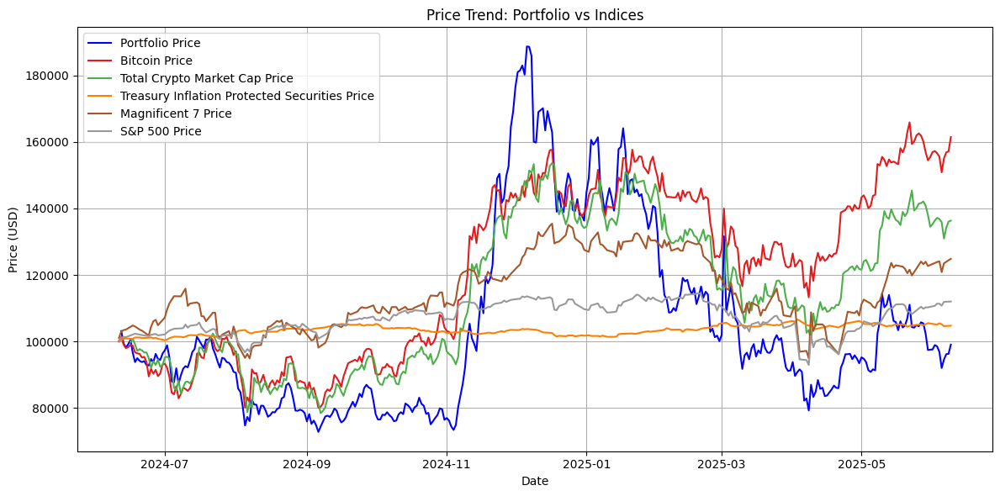

In [153]:
plot_price(portfolio_8_df, index_dict)

### Portfolio Return Visualization

/var/folders/5r/1lsvb2gx50n91j4gfq7gvff80000gn/T/ipykernel_1245/4705473.py:15: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = cm.get_cmap('Set1', len(index_dict))


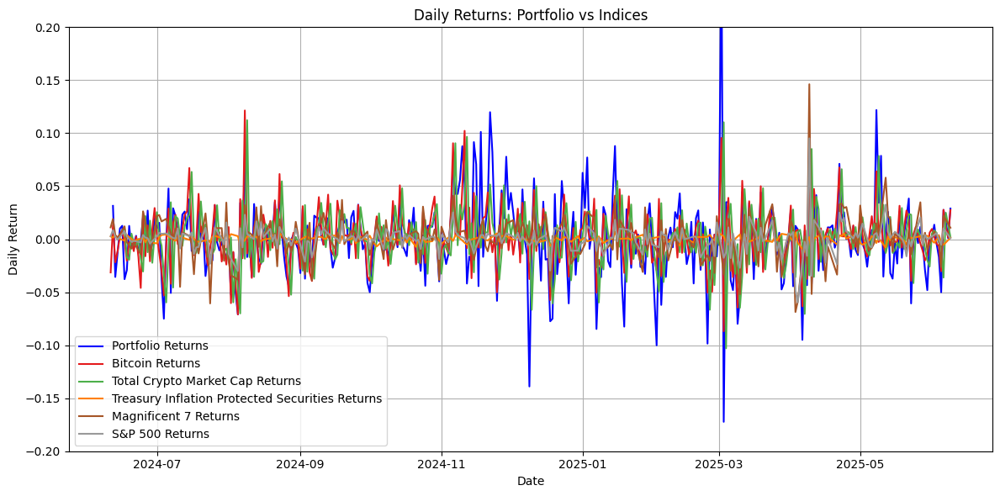

In [154]:
plot_returns(portfolio_8_df, index_dict)

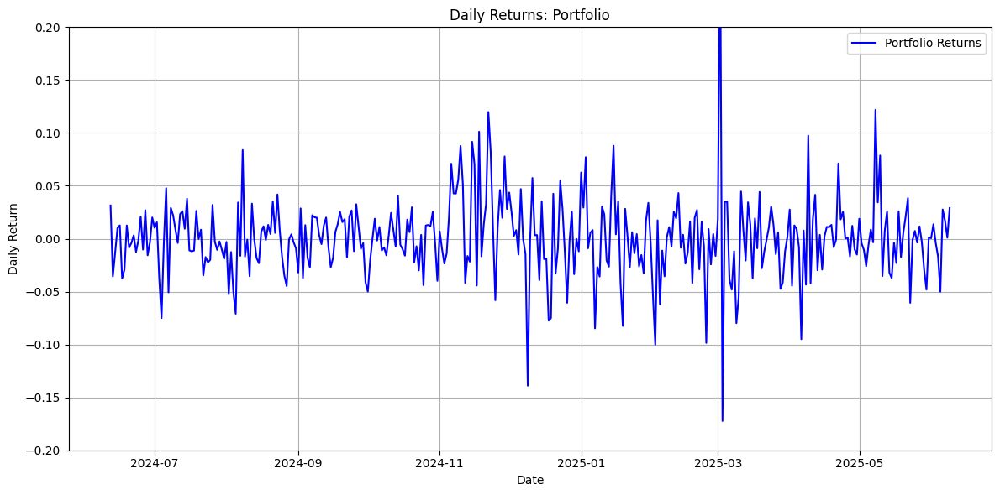

In [156]:
plot_returns(portfolio_8_df)

<h3 style="text-align: center;"><strong>Ultra-Diversified Portfolio</strong></h3>

- USDC: 10% 
- BTC: 10% 
- ETH: 10% 
- BNB: 10% 
- XRP: 10% 
- DOT: 10%
- ADA: 10% 
- SOL: 10% 
- DOGE: 10% 
- SHIB: 10% 

In [157]:
BNB_data = fetch_price('BNB', period='1y')
XRP_data = fetch_price('XRP', period='1y')
coin_dict['BNB'] = BNB_data
coin_dict['XRP'] = XRP_data
print(coin_dict.keys())

dict_keys(['USDC', 'BTC', 'ETH', 'ADA', 'SOL', 'DOT', 'LINK', 'AVAX', 'DOGE', 'SHIB', 'UNI', 'AAVE', 'COMP', 'MANA', 'SAND', 'ENJ', 'ALGO', 'XTZ', 'BNB', 'XRP'])


### Portfolio Data:

In [158]:
portfolio_9 = build_portfolio(coin_dict, [0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0, 0, 0.1, 0.1, 0, 0, 0, 0, 0, 0,
                                          0, 0, 0.1, 0.1], investment_amount=100000)

 Portfolio Breakdown:
 - USDC:
    Price: $1.00
    Allocation: $10,000.00
    Total USDC Purchased: 9,999.179907
 - BTC:
    Price: $67,332.03
    Allocation: $10,000.00
    Total BTC Purchased: 0.148518
 - ETH:
    Price: $3,498.33
    Allocation: $10,000.00
    Total ETH Purchased: 2.858506
 - ADA:
    Price: $0.42
    Allocation: $10,000.00
    Total ADA Purchased: 23,702.804537
 - SOL:
    Price: $149.43
    Allocation: $10,000.00
    Total SOL Purchased: 66.921421
 - DOT:
    Price: $6.38
    Allocation: $10,000.00
    Total DOT Purchased: 1,567.423395
 - LINK:
    Price: $15.00
    Allocation: $0.00
    Total LINK Purchased: 0.000000
 - AVAX:
    Price: $31.54
    Allocation: $0.00
    Total AVAX Purchased: 0.000000
 - DOGE:
    Price: $0.14
    Allocation: $10,000.00
    Total DOGE Purchased: 72,409.195379
 - SHIB:
    Price: $0.00
    Allocation: $10,000.00
    Total SHIB Purchased: 454,545,450.995268
 - UNI:
    Price: $8.98
    Allocation: $0.00
    Total UNI Purchased: 0.00

In [159]:
portfolio_9_df = build_portfolio_time_series(coin_dict, portfolio_9)
portfolio_9_df

,Close,returns
Date,,
2024-06-12,102733.586458,0.027336
2024-06-13,99281.149308,-0.033606
2024-06-14,97492.870555,-0.018012
2024-06-15,99047.617378,0.015947
2024-06-16,100003.623656,0.009652
...,...,...
2025-06-05,134614.333429,-0.050385
2025-06-06,138250.228415,0.027010
2025-06-07,140508.631079,0.016336


### Volatility Score:

In [164]:
portfolio_9_score_btc = calculate_volatility_score_portfolio(portfolio_9_df, total_data_index, rel_vol_weight=1, beta_weight=1)
portfolio_9_score_total = calculate_volatility_score_portfolio(portfolio_9_df, btc_data_index, rel_vol_weight=1, beta_weight=1)
portfolio_9_score_sp500 = calculate_volatility_score_portfolio(portfolio_9_df, sp500_data, rel_vol_weight=1, beta_weight=1)
portfolio_9_score_mag7 = calculate_volatility_score_portfolio(portfolio_9_df, mag7_data, rel_vol_weight=1, beta_weight=1)

portfolio_9_vol_df = pd.DataFrame({
    'Portfolio': ['Portfolio 9: Ultra-diversified Portfolio'],
    'Volatility_Score_BTC': [portfolio_9_score_btc],
    'Volatility_Score_Total': [portfolio_9_score_total],
    'Volatility_Score_SP500': [portfolio_9_score_sp500],
    'Volatility_Score_MAG7': [portfolio_9_score_mag7]
})
portfolio_vol_scores_df = pd.concat([portfolio_vol_scores_df, portfolio_9_vol_df], ignore_index=True)
portfolio_vol_scores_df

,Portfolio,Volatility_Score_BTC,Volatility_Score_Total,Volatility_Score_SP500,Volatility_Score_MAG7
0,Portfolio 1: Conservative Portfolio,0.375121,0.862535,2.429114,1.167003
1,Portfolio 2: Balanced Portfolio,0.773813,1.598558,4.719464,2.251840
2,Portfolio 3: Growth Portfolio,0.750937,1.704959,4.756805,2.300040
3,Portfolio 4: High-Risk Portfolio,1.059213,2.099788,6.112758,2.914623
4,Portfolio 5: Memecoin heavy Portfolio,1.513586,2.460068,7.951783,3.715549
5,Portfolio 6: DeFi Portfolio,1.118940,2.164743,7.450628,3.536236
6,Portfolio 7: NFT/Metaverse Portfolio,0.951068,1.946735,5.645880,2.703595
7,Portfolio 8: Tech-Oriented Portfolio,1.207974,2.169449,6.890024,3.267337
8,Portfolio 9: Ultra-diversified Portfolio,1.723256,2.604549,9.179092,4.274154


### AQM Score:

In [165]:
AQM_portfolio_9_btc = calculate_AQM_portfolio(portfolio_9_df, btc_data_index)
AQM_portfolio_9_tip = calculate_AQM_portfolio(portfolio_9_df, tip_data)
AQM_portfolio_9_sp500 = calculate_AQM_portfolio(portfolio_9_df, sp500_data)

AQM_portfolio_9_df = pd.DataFrame({
    'Portfolio': ['Portfolio 9: Ultra-diversified Portfolio'],
    'AQM_Score_BTC': [AQM_portfolio_9_btc],
    'AQM_Score_TIP': [AQM_portfolio_9_tip],
    'AQM_Score_SP500': [AQM_portfolio_9_sp500]
})
AQM_portfolio_df = pd.concat([AQM_portfolio_df, AQM_portfolio_9_df], ignore_index=True)
AQM_portfolio_df

,Portfolio,AQM_Score_BTC,AQM_Score_TIP,AQM_Score_SP500
0,Portfolio 1: Conservative Portfolio,0.802406,0.076694,0.223354
1,Portfolio 2: Balanced Portfolio,0.694137,0.050633,0.208513
2,Portfolio 3: Growth Portfolio,0.760495,0.053860,0.226042
3,Portfolio 4: High-Risk Portfolio,0.764276,0.056679,0.213962
4,Portfolio 5: Memecoin heavy Portfolio,0.691626,0.061425,0.181969
5,Portfolio 6: DeFi Portfolio,0.496308,0.141103,0.280672
6,Portfolio 7: NFT/Metaverse Portfolio,0.543359,0.004616,0.151545
7,Portfolio 8: Tech-Oriented Portfolio,0.541036,0.029378,0.167745
8,Portfolio 9: Ultra-diversified Portfolio,0.695155,0.061621,0.209854


### Portfolio Price Visualization

/var/folders/5r/1lsvb2gx50n91j4gfq7gvff80000gn/T/ipykernel_1245/4705473.py:46: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = cm.get_cmap('Set1', len(index_dict))


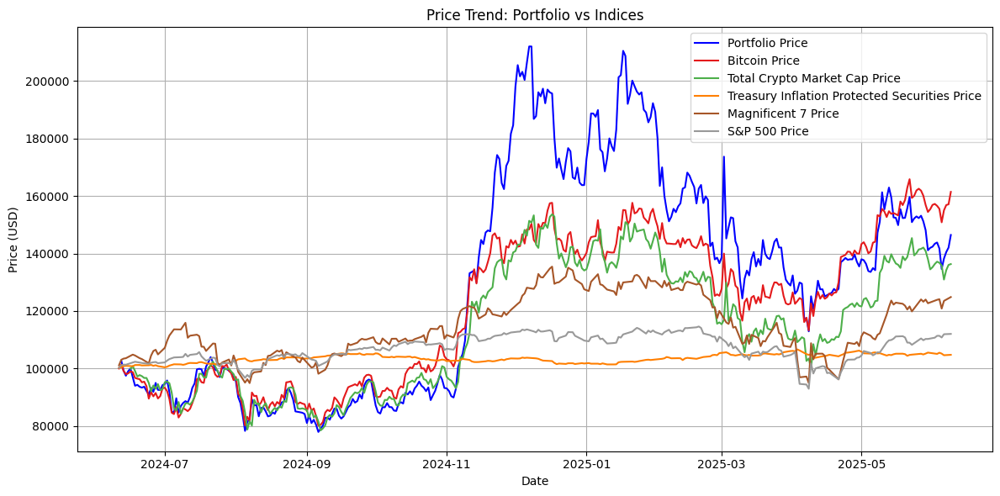

In [166]:
plot_price(portfolio_9_df, index_dict)

/var/folders/5r/1lsvb2gx50n91j4gfq7gvff80000gn/T/ipykernel_1245/4705473.py:15: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = cm.get_cmap('Set1', len(index_dict))


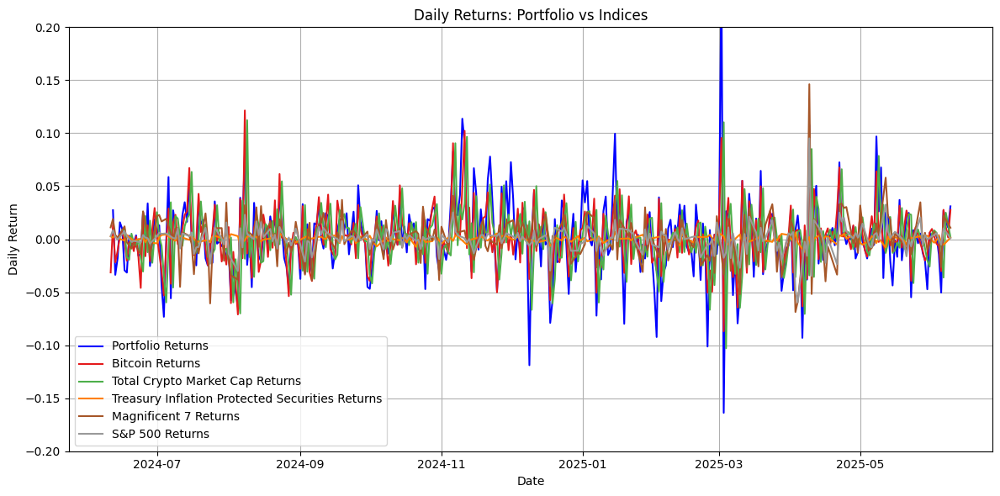

In [167]:
plot_returns(portfolio_9_df, index_dict)

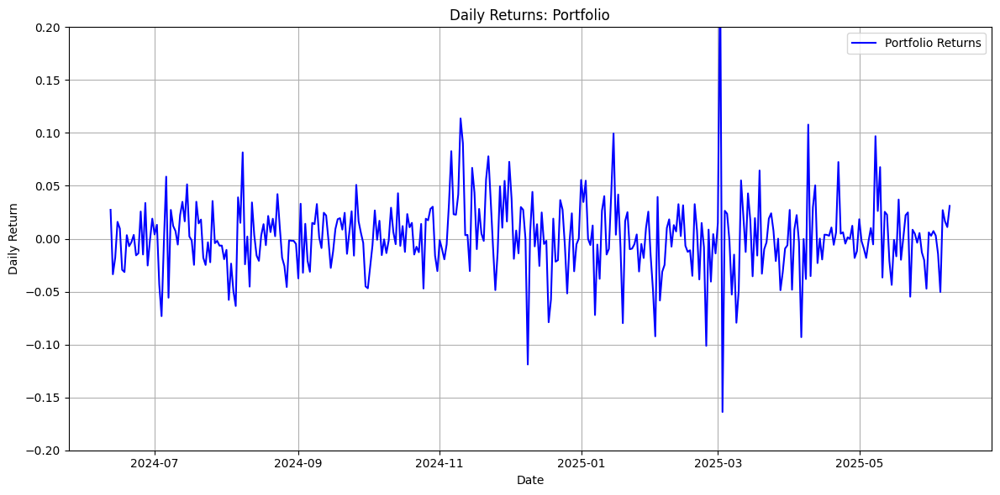

In [168]:
plot_returns(portfolio_9_df)

<h3 style="text-align: center;"><strong>Aggresive Small-Cap Portfolio</strong></h3>

This portfolio was not successfully simulated, MATIC and FTM's ticker were changed. MATIC-USD was changed to POL-USD and FTM-USD was changed to S32684-USD


Because of that, I changed MATIC to ARB and FTM to NEAR, very similar coins in terms of sector and market cap

- USDC: 5% 
- BTC: 15% 
- ETH: 10% 
- ARB: 20% 
- ATOM: 20% 
- NEAR: 15% 
- HBAR: 15% 

In [169]:
ARB_data = fetch_price('ARB', period='1y')
NEAR_data = fetch_price('NEAR', period='1y')
ATOM_data = fetch_price('ATOM', period='1y')
HBAR_data = fetch_price('HBAR', period='1y')
coin_dict['ATOM'] = ATOM_data
coin_dict['ARB'] = ARB_data
coin_dict['NEAR'] = NEAR_data
coin_dict['HBAR'] = HBAR_data
print(coin_dict.keys())

dict_keys(['USDC', 'BTC', 'ETH', 'ADA', 'SOL', 'DOT', 'LINK', 'AVAX', 'DOGE', 'SHIB', 'UNI', 'AAVE', 'COMP', 'MANA', 'SAND', 'ENJ', 'ALGO', 'XTZ', 'BNB', 'XRP', 'ATOM', 'ARB', 'NEAR', 'HBAR'])


### Portfolio Data:

In [170]:
portfolio_10 = build_portfolio(coin_dict, [
    0.05,
    0.15,
    0.10,
    0.0,
    0.0,
    0.0,
    0.0,
    0.0,
    0.0,
    0.0,
    0.0,
    0.0,
    0.0,
    0.0,
    0.0,
    0.0,
    0.0,
    0.0,
    0.0,
    0.0,
    0.20,
    0.15,
    0.20,
    0.15
], investment_amount=100000)

 Portfolio Breakdown:
 - USDC:
    Price: $1.00
    Allocation: $5,000.00
    Total USDC Purchased: 4,999.589954
 - BTC:
    Price: $67,332.03
    Allocation: $15,000.00
    Total BTC Purchased: 0.222777
 - ETH:
    Price: $3,498.33
    Allocation: $10,000.00
    Total ETH Purchased: 2.858506
 - ADA:
    Price: $0.42
    Allocation: $0.00
    Total ADA Purchased: 0.000000
 - SOL:
    Price: $149.43
    Allocation: $0.00
    Total SOL Purchased: 0.000000
 - DOT:
    Price: $6.38
    Allocation: $0.00
    Total DOT Purchased: 0.000000
 - LINK:
    Price: $15.00
    Allocation: $0.00
    Total LINK Purchased: 0.000000
 - AVAX:
    Price: $31.54
    Allocation: $0.00
    Total AVAX Purchased: 0.000000
 - DOGE:
    Price: $0.14
    Allocation: $0.00
    Total DOGE Purchased: 0.000000
 - SHIB:
    Price: $0.00
    Allocation: $0.00
    Total SHIB Purchased: 0.000000
 - UNI:
    Price: $8.98
    Allocation: $0.00
    Total UNI Purchased: 0.000000
 - AAVE:
    Price: $87.74
    Allocation: $0.

In [171]:
portfolio_10_df = build_portfolio_time_series(coin_dict, portfolio_10)
portfolio_10_df

,Close,returns
Date,,
2024-06-12,103112.139041,0.031121
2024-06-13,99112.195616,-0.038792
2024-06-14,96506.087405,-0.026295
2024-06-15,96707.499698,0.002087
2024-06-16,97651.282579,0.009759
...,...,...
2025-06-05,92065.839610,-0.037710
2025-06-06,94110.280894,0.022206
2025-06-07,95948.574809,0.019533


### Volatility Score

<h4>Against Total Crypto Market Capitalization</h4>

In [173]:
portfolio_10_vol_score_btc = calculate_volatility_score_portfolio(portfolio_10_df, total_data_index, rel_vol_weight=1, beta_weight=1)
portfolio_10_vol_score_total = calculate_volatility_score_portfolio(portfolio_10_df, btc_data_index, rel_vol_weight=1, beta_weight=1)
portfolio_10_vol_score_sp500 = calculate_volatility_score_portfolio(portfolio_10_df, sp500_data, rel_vol_weight=1, beta_weight=1)
portfolio_10_vol_score_mag7 = calculate_volatility_score_portfolio(portfolio_10_df, mag7_data, rel_vol_weight=1, beta_weight=1)

portfolio_10_vol_df = pd.DataFrame({
    'Portfolio': ['Portfolio 10: Aggresive Small-Cap Portfolio'],
    'Volatility_Score_BTC': [portfolio_10_vol_score_btc],
    'Volatility_Score_Total': [portfolio_10_vol_score_total],
    'Volatility_Score_SP500': [portfolio_10_vol_score_sp500],
    'Volatility_Score_MAG7': [portfolio_10_vol_score_mag7]
})
portfolio_vol_scores_df = pd.concat([portfolio_vol_scores_df, portfolio_10_vol_df], ignore_index=True)
portfolio_vol_scores_df

,Portfolio,Volatility_Score_BTC,Volatility_Score_Total,Volatility_Score_SP500,Volatility_Score_MAG7
0,Portfolio 1: Conservative Portfolio,0.375121,0.862535,2.429114,1.167003
1,Portfolio 2: Balanced Portfolio,0.773813,1.598558,4.719464,2.251840
2,Portfolio 3: Growth Portfolio,0.750937,1.704959,4.756805,2.300040
3,Portfolio 4: High-Risk Portfolio,1.059213,2.099788,6.112758,2.914623
4,Portfolio 5: Memecoin heavy Portfolio,1.513586,2.460068,7.951783,3.715549
5,Portfolio 6: DeFi Portfolio,1.118940,2.164743,7.450628,3.536236
6,Portfolio 7: NFT/Metaverse Portfolio,0.951068,1.946735,5.645880,2.703595
7,Portfolio 8: Tech-Oriented Portfolio,1.207974,2.169449,6.890024,3.267337
8,Portfolio 9: Ultra-diversified Portfolio,1.723256,2.604549,9.179092,4.274154
9,Portfolio 10: Aggresive Small-Cap Portfolio,1.214392,1.976117,6.249874,2.979847


### AQM Score:

In [174]:
AQM_portfolio_10_btc = calculate_AQM_portfolio(portfolio_10_df, btc_data_index)
AQM_portfolio_10_tip = calculate_AQM_portfolio(portfolio_10_df, tip_data)
AQM_portfolio_10_sp500 = calculate_AQM_portfolio(portfolio_10_df, sp500_data)

AQM_portfolio_10_df = pd.DataFrame({
    'Portfolio': ['Portfolio 10: Aggresive Small-Cap Portfolio'],
    'AQM_Score_BTC': [AQM_portfolio_10_btc],
    'AQM_Score_TIP': [AQM_portfolio_10_tip],
    'AQM_Score_SP500': [AQM_portfolio_10_sp500]
})
AQM_portfolio_df = pd.concat([AQM_portfolio_df, AQM_portfolio_10_df], ignore_index=True)
AQM_portfolio_df

,Portfolio,AQM_Score_BTC,AQM_Score_TIP,AQM_Score_SP500
0,Portfolio 1: Conservative Portfolio,0.802406,0.076694,0.223354
1,Portfolio 2: Balanced Portfolio,0.694137,0.050633,0.208513
2,Portfolio 3: Growth Portfolio,0.760495,0.053860,0.226042
3,Portfolio 4: High-Risk Portfolio,0.764276,0.056679,0.213962
4,Portfolio 5: Memecoin heavy Portfolio,0.691626,0.061425,0.181969
5,Portfolio 6: DeFi Portfolio,0.496308,0.141103,0.280672
6,Portfolio 7: NFT/Metaverse Portfolio,0.543359,0.004616,0.151545
7,Portfolio 8: Tech-Oriented Portfolio,0.541036,0.029378,0.167745
8,Portfolio 9: Ultra-diversified Portfolio,0.695155,0.061621,0.209854
9,Portfolio 10: Aggresive Small-Cap Portfolio,0.451432,0.116914,0.211792


### Portfolio Price Visualization

/var/folders/5r/1lsvb2gx50n91j4gfq7gvff80000gn/T/ipykernel_1245/4705473.py:46: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = cm.get_cmap('Set1', len(index_dict))


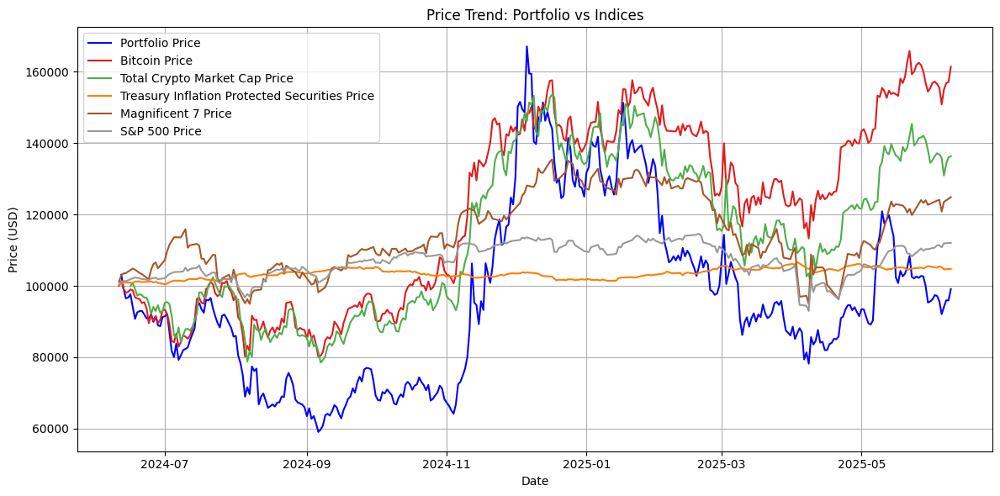

In [175]:
plot_price(portfolio_10_df, index_dict)

/var/folders/5r/1lsvb2gx50n91j4gfq7gvff80000gn/T/ipykernel_1245/4705473.py:15: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = cm.get_cmap('Set1', len(index_dict))


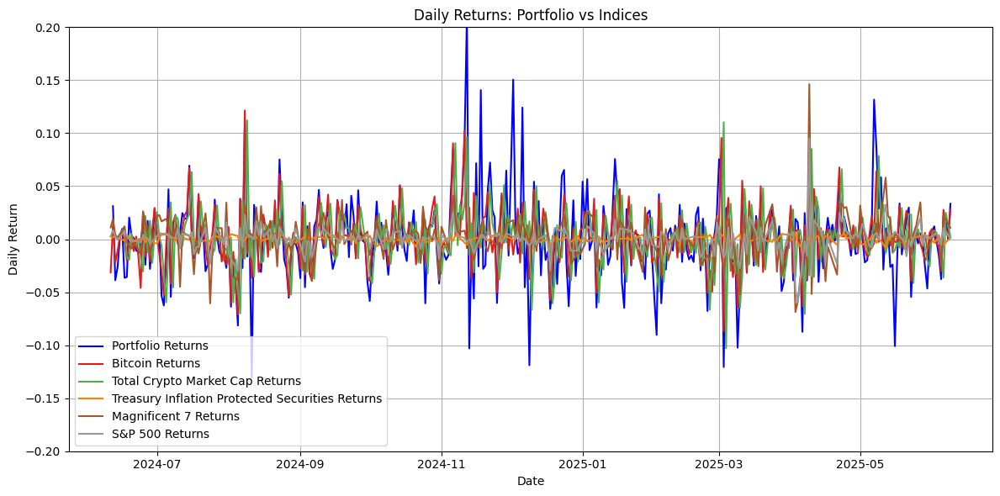

In [176]:
plot_returns(portfolio_10_df, index_dict)

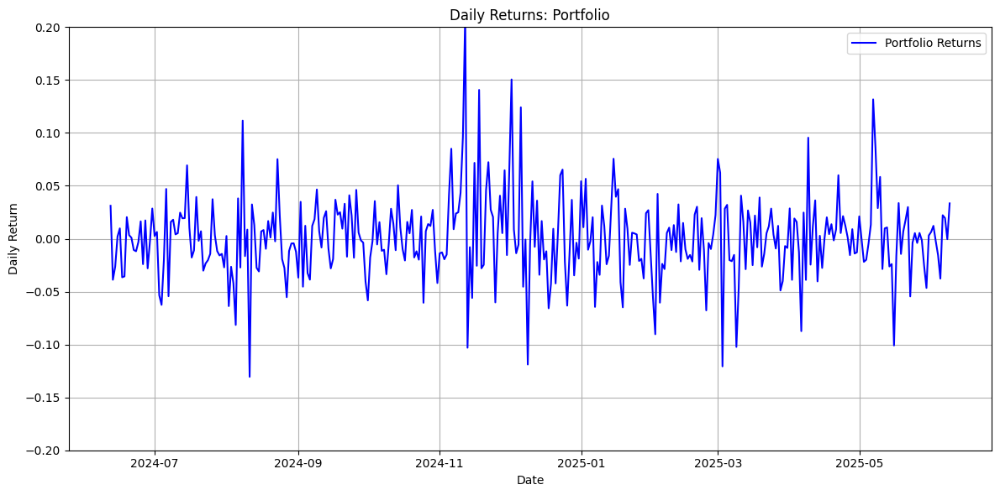

In [177]:
plot_returns(portfolio_10_df)

<h2>Summary and Outliers</h2>

## All individual coin Volatility Score and AQMs:

### Volatility Score:

In [179]:
vol_btc = calculate_volatility_score_coin(coin_dict, btc_data_index, rel_vol_weight=1, beta_weight=1)
vol_total = calculate_volatility_score_coin(coin_dict, total_data_index, rel_vol_weight=1, beta_weight=1)
vol_sp500 = calculate_volatility_score_coin(coin_dict, sp500_data, rel_vol_weight=1, beta_weight=1)
vol_mag7 = calculate_volatility_score_coin(coin_dict, mag7_data, rel_vol_weight=1, beta_weight=1)

coin_vol_scores = pd.DataFrame({
    'Coin': vol_btc.keys(),
    'Volatility_Score_BTC': vol_btc.values(),
    'Volatility_Score_Total': [vol_total[coin] for coin in vol_btc],
    'Volatility_Score_SP500': [vol_sp500[coin] for coin in vol_btc],
    'Volatility_Score_MAG7': [vol_mag7[coin] for coin in vol_btc]
})

coin_vol_scores

,Coin,Volatility_Score_BTC,Volatility_Score_Total,Volatility_Score_SP500,Volatility_Score_MAG7
0,USDC,-0.000046,0.000579,0.001753,0.000496
1,BTC,2.002755,1.132658,6.520532,3.027954
2,ETH,1.859785,0.727253,5.291565,2.562464
3,ADA,3.881340,2.774143,14.427271,6.607105
4,SOL,2.279976,1.019081,6.563840,3.132967
5,DOT,2.013295,1.080142,6.102528,2.877147
6,LINK,2.558433,1.389134,8.265009,3.966581
7,AVAX,2.410818,1.317081,7.131961,3.430618
8,DOGE,4.491430,3.508790,17.398300,7.956691
9,SHIB,2.090495,0.963869,5.525060,2.525304


#### Sorted 'Volatility_Score_Total' Descending:

In [219]:
coin_vol_scores.sort_values(by='Volatility_Score_Total', ascending=False)

,Coin,Volatility_Score_BTC,Volatility_Score_Total,Volatility_Score_SP500,Volatility_Score_MAG7
19,XRP,8.623725,8.770289,43.399487,19.321804
23,HBAR,5.378878,4.838330,24.581621,11.183433
11,AAVE,4.731986,3.883621,20.855949,9.502647
8,DOGE,4.491430,3.508790,17.398300,7.956691
16,ALGO,3.886233,2.931789,15.280828,7.029752
3,ADA,3.881340,2.774143,14.427271,6.607105
21,ARB,1.363082,1.948244,5.522002,2.419195
14,SAND,2.859187,1.820143,9.589495,4.461957
17,XTZ,2.507130,1.548698,8.666116,4.034601
12,COMP,2.359432,1.437299,8.281853,3.866669


<h3 style = "text-align: center;"> Invesitagting top 5 coins with the highest volatility Score </h3>

#### XRP:

/var/folders/5r/1lsvb2gx50n91j4gfq7gvff80000gn/T/ipykernel_1245/4705473.py:46: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = cm.get_cmap('Set1', len(index_dict))


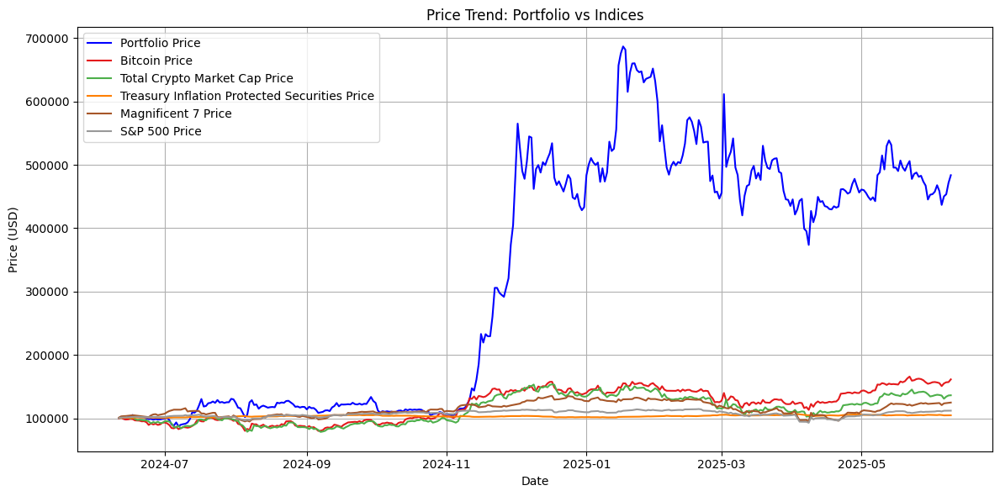

In [198]:
xrp_copy = XRP_data.copy()
xrp_start_price = 100_000 / xrp_copy['Close'].iloc[0]  # to reflect $100k worth of XRP at last year perfectly
xrp_copy['Close'] = xrp_copy['Close'] * xrp_start_price
plot_price(xrp_copy, index_dict)

#### HBAR:

/var/folders/5r/1lsvb2gx50n91j4gfq7gvff80000gn/T/ipykernel_1245/4705473.py:46: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = cm.get_cmap('Set1', len(index_dict))


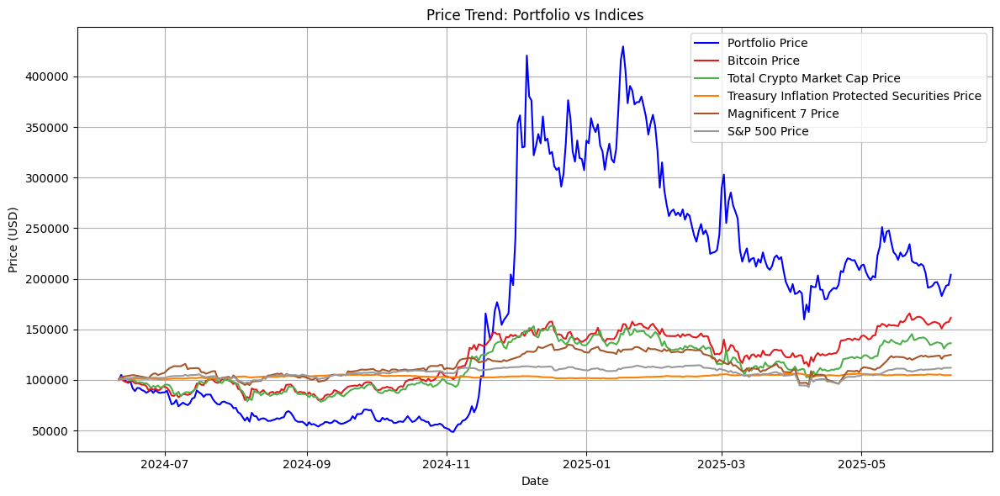

In [197]:
hbar_copy = HBAR_data.copy()
hbar_start_price = 100_000 / hbar_copy['Close'].iloc[0]  # to reflect $100k worth of HBAR at last year perfectly
hbar_copy['Close'] = hbar_copy['Close'] * hbar_start_price
plot_price(hbar_copy, index_dict)

#### AAVE:

/var/folders/5r/1lsvb2gx50n91j4gfq7gvff80000gn/T/ipykernel_1245/4705473.py:46: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = cm.get_cmap('Set1', len(index_dict))


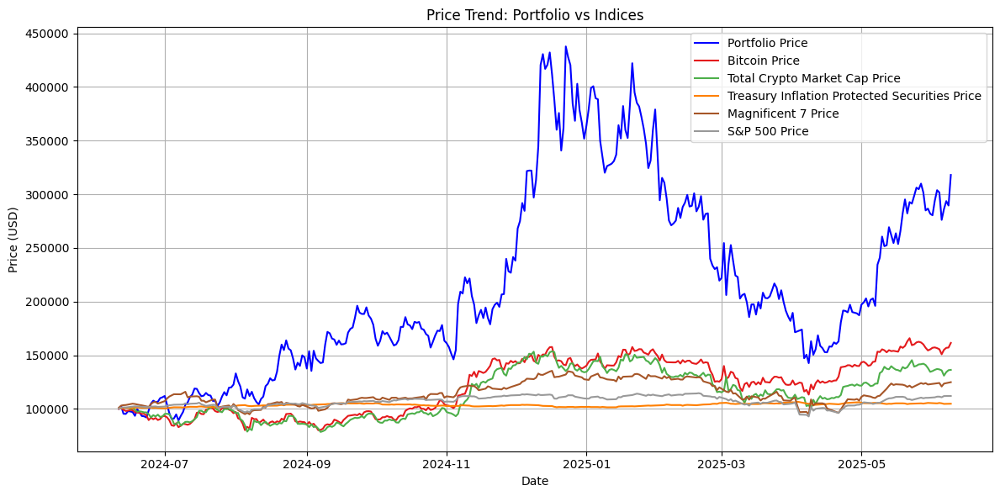

In [196]:
AAVE_copy = AAVE_data.copy()
aave_start_price = 100_000 / AAVE_copy['Close'].iloc[0]  # to reflect $100k worth of AAVE at last year perfectly
AAVE_copy['Close'] = AAVE_copy['Close'] * aave_start_price
plot_price(AAVE_copy, index_dict)

#### DOGE:

/var/folders/5r/1lsvb2gx50n91j4gfq7gvff80000gn/T/ipykernel_1245/4705473.py:46: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = cm.get_cmap('Set1', len(index_dict))


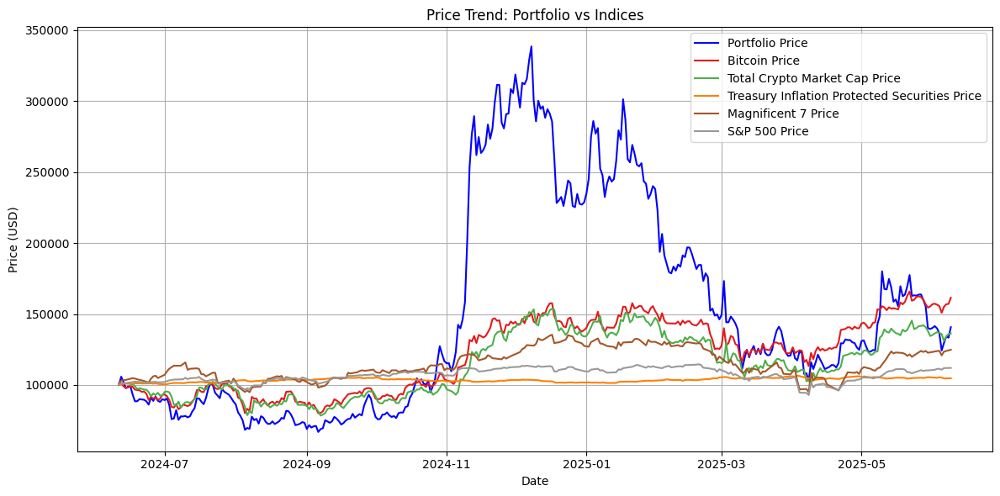

In [195]:
doge_copy = DOGE_data.copy()
doge_start_price = 100_000 / doge_copy['Close'].iloc[0]  # to reflect $100k worth of DOGE at last year perfectly
doge_copy['Close'] = doge_copy['Close'] * doge_start_price
plot_price(doge_copy, index_dict)

#### ALGO:

/var/folders/5r/1lsvb2gx50n91j4gfq7gvff80000gn/T/ipykernel_1245/4705473.py:46: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = cm.get_cmap('Set1', len(index_dict))


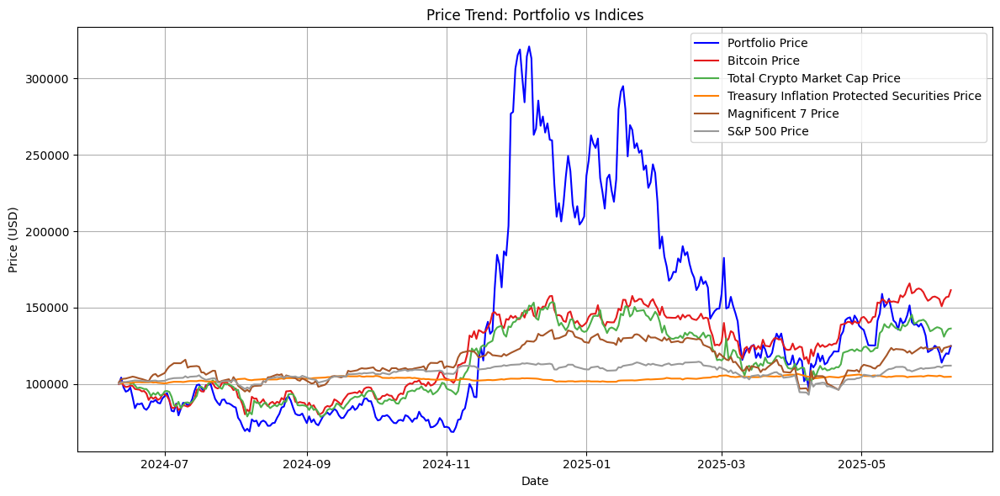

In [199]:
algo_copy = ALGO_data.copy()
algo_start_price = 100_000 / algo_copy['Close'].iloc[0]  # to reflect $100k worth of ALGO at last year perfectly
algo_copy['Close'] = algo_copy['Close'] * algo_start_price
plot_price(algo_copy, index_dict)

<h3 style = "text-align: center;"> Invesitagting top 5 coins with the lowest volatility Score </h3>

#### USDC:

/var/folders/5r/1lsvb2gx50n91j4gfq7gvff80000gn/T/ipykernel_1245/4705473.py:46: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = cm.get_cmap('Set1', len(index_dict))


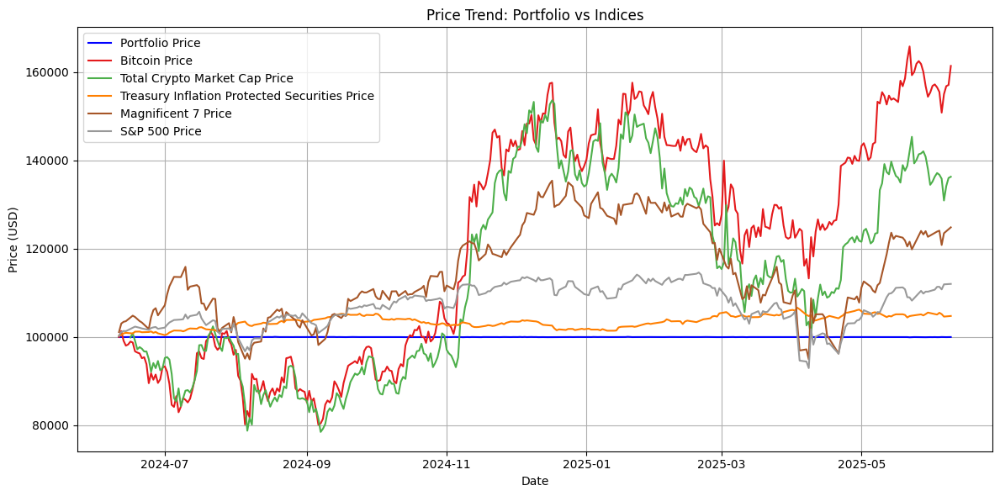

In [205]:
usdc_copy = USDC_data.copy()
usdc_start_price = 100_000 / usdc_copy['Close'].iloc[0]  # to reflect $100k worth of USDC at last year perfectly
usdc_copy['Close'] = usdc_copy['Close'] * usdc_start_price
plot_price(usdc_copy, index_dict)

#### BNB:

/var/folders/5r/1lsvb2gx50n91j4gfq7gvff80000gn/T/ipykernel_1245/4705473.py:46: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = cm.get_cmap('Set1', len(index_dict))


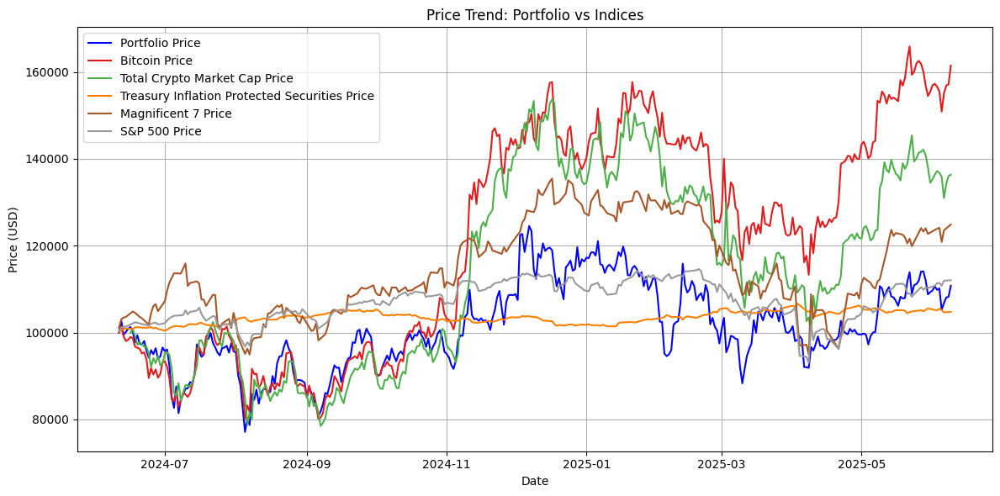

In [206]:
bnb_copy = BNB_data.copy()
bnb_start_price = 100_000 / bnb_copy['Close'].iloc[0]  # to reflect $100k worth of BNB at last year perfectly
bnb_copy['Close'] = bnb_copy['Close'] * bnb_start_price
plot_price(bnb_copy, index_dict)

#### ETH:

/var/folders/5r/1lsvb2gx50n91j4gfq7gvff80000gn/T/ipykernel_1245/4705473.py:46: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = cm.get_cmap('Set1', len(index_dict))


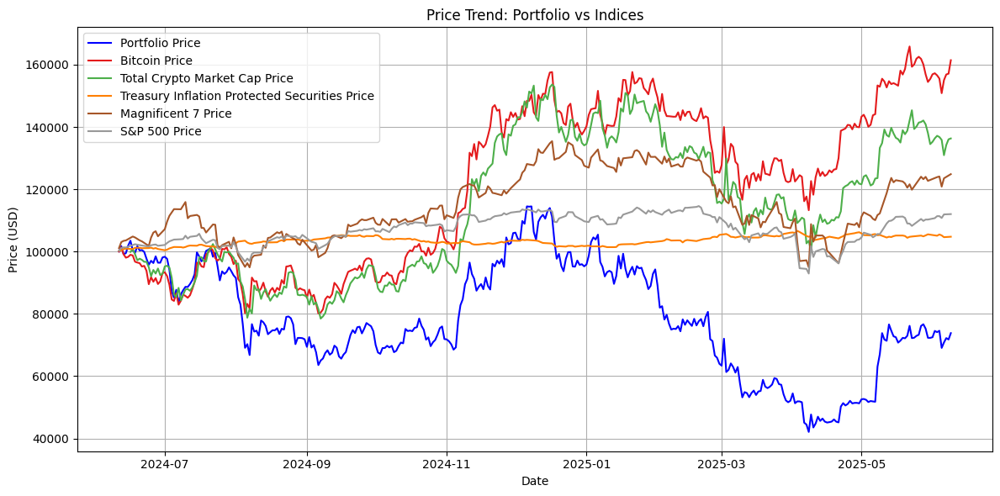

In [212]:
eth_copy = ETH_data.copy()
eth_start_price = 100_000 / eth_copy['Close'].iloc[0]  # to reflect $100k worth of ETH at last year perfectly
eth_copy['Close'] = eth_copy['Close'] * eth_start_price
plot_price(eth_copy, index_dict)

Note: This is bad. ETH shows a very low vol score and it underperforms

#### ATOM:

/var/folders/5r/1lsvb2gx50n91j4gfq7gvff80000gn/T/ipykernel_1245/4705473.py:46: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = cm.get_cmap('Set1', len(index_dict))


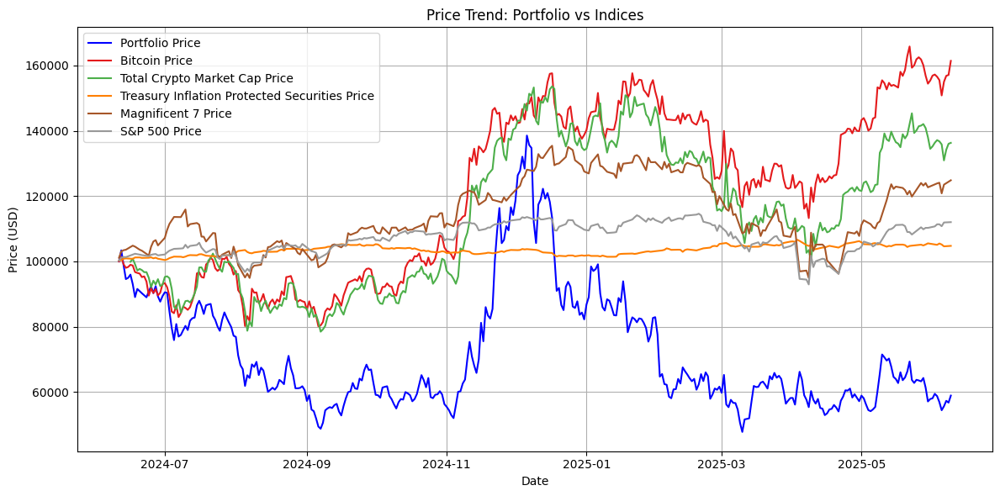

In [213]:
atom_copy = ATOM_data.copy()
atom_start_price = 100_000 / atom_copy['Close'].iloc[0]  # to reflect $100k worth of ATOM at last year perfectly
atom_copy['Close'] = atom_copy['Close'] * atom_start_price
plot_price(atom_copy, index_dict)

#### SHIB:

/var/folders/5r/1lsvb2gx50n91j4gfq7gvff80000gn/T/ipykernel_1245/4705473.py:46: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = cm.get_cmap('Set1', len(index_dict))


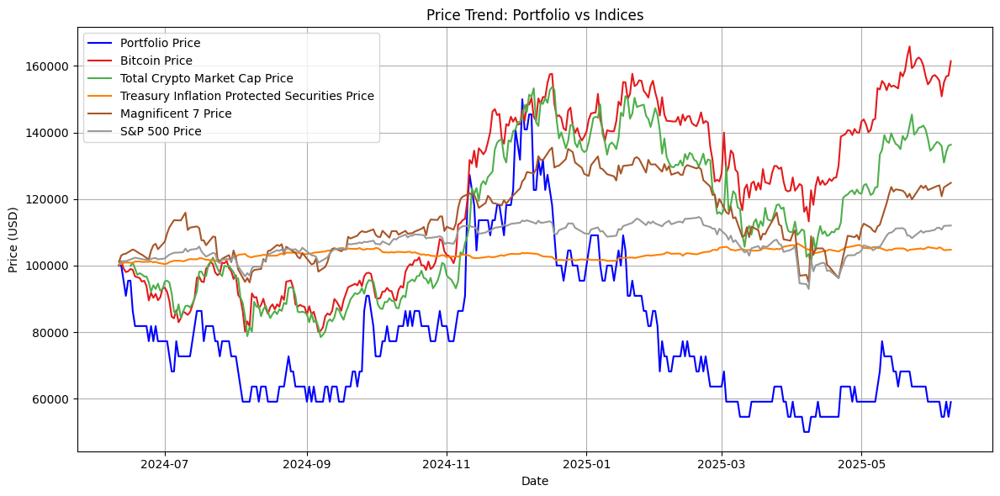

In [214]:
shib_copy = SHIB_data.copy()
shib_start_price = 100_000 / shib_copy['Close'].iloc[0]  # to reflect $100k worth of SHIB at last year perfectly
shib_copy['Close'] = shib_copy['Close'] * shib_start_price
plot_price(shib_copy, index_dict)

## AQM Score:

In [183]:
AQM_tip = calculate_AQM_coin(coin_dict, tip_data)
AQM_btc = calculate_AQM_coin(coin_dict, btc_data_index)
AQM_sp500 = calculate_AQM_coin(coin_dict, sp500_data)
aqm_df = pd.DataFrame({
    'Coin': AQM_tip.keys(),
    'AQM_Score_TIP': AQM_tip.values(),
    'AQM_Score_BTC': [AQM_btc[coin] for coin in AQM_tip],
    'AQM_Score_SP500': [AQM_sp500[coin] for coin in AQM_tip],
})
aqm_df

,Coin,AQM_Score_TIP,AQM_Score_BTC,AQM_Score_SP500
0,USDC,-3.963126,-33.041373,-10.987884
1,BTC,0.152822,1.000000,0.293660
2,ETH,0.008623,0.575427,0.204928
3,ADA,0.082823,0.474623,0.188869
4,SOL,0.048502,0.564930,0.185436
5,DOT,-0.028684,0.349463,0.066444
6,LINK,0.091948,0.468809,0.223036
7,AVAX,0.055450,0.490718,0.182501
8,DOGE,0.123750,0.670654,0.232182
9,SHIB,-20.047630,-387.010879,-95.624514


#### Sorted 'AQM_Score_TIP BTC' Descending

In [218]:
aqm_df.sort_values(by='AQM_Score_BTC', ascending=False)

,Coin,AQM_Score_TIP,AQM_Score_BTC,AQM_Score_SP500
21,ARB,31.834475,11.469065,30.706415
1,BTC,0.152822,1.000000,0.293660
8,DOGE,0.123750,0.670654,0.232182
2,ETH,0.008623,0.575427,0.204928
4,SOL,0.048502,0.564930,0.185436
7,AVAX,0.055450,0.490718,0.182501
3,ADA,0.082823,0.474623,0.188869
6,LINK,0.091948,0.468809,0.223036
22,NEAR,-0.005479,0.456551,0.110984
11,AAVE,0.261961,0.443436,0.372178


#### Invesitgating highest 5 AQMS excluding BTC

#### ARB:

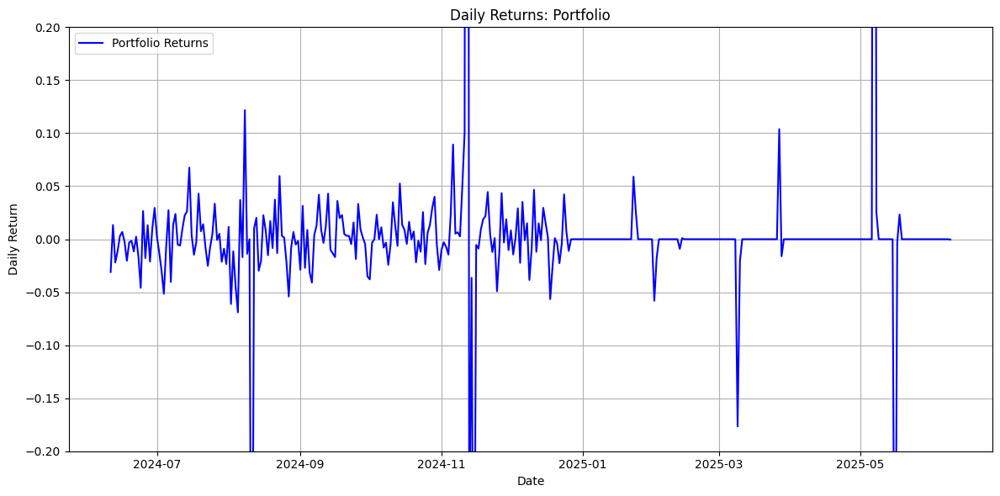

In [201]:
plot_returns(ARB_data)

#### DOGE:

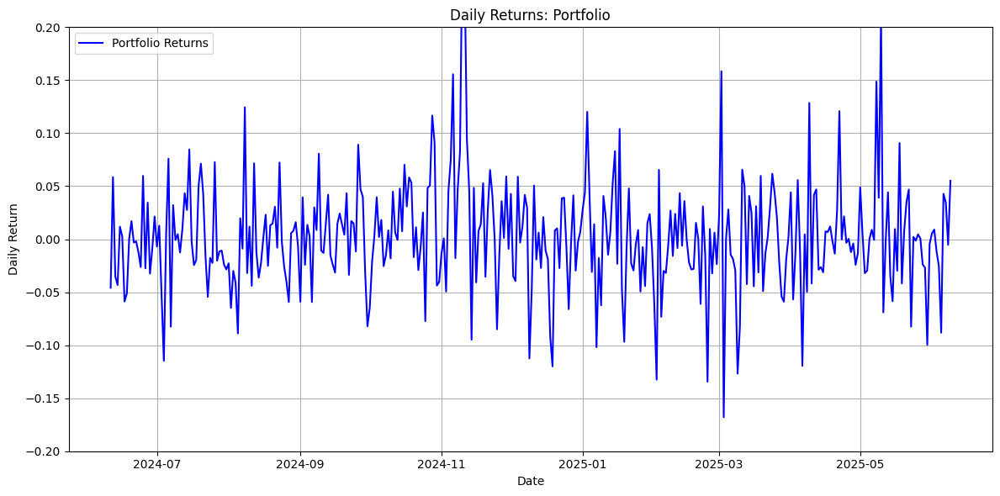

In [202]:
plot_returns(DOGE_data)

#### ETH:

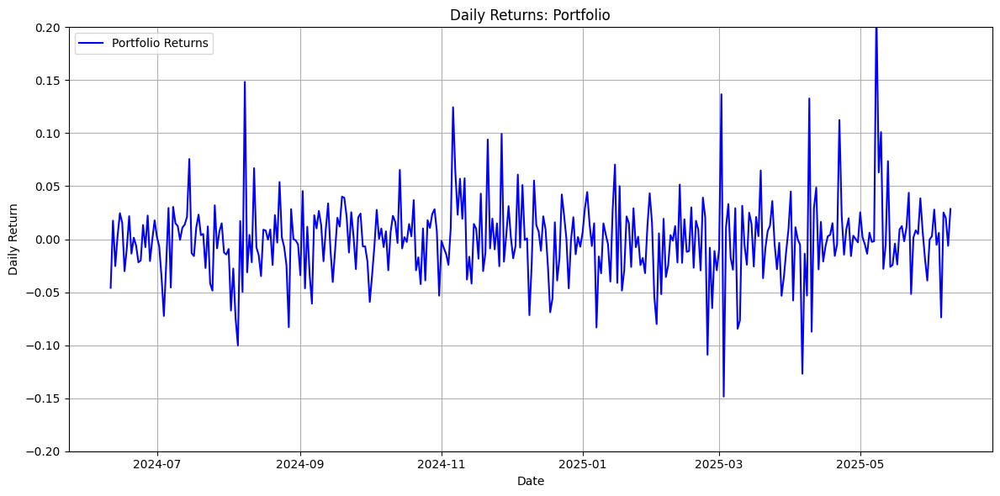

In [203]:
plot_returns(ETH_data)

#### SOL:

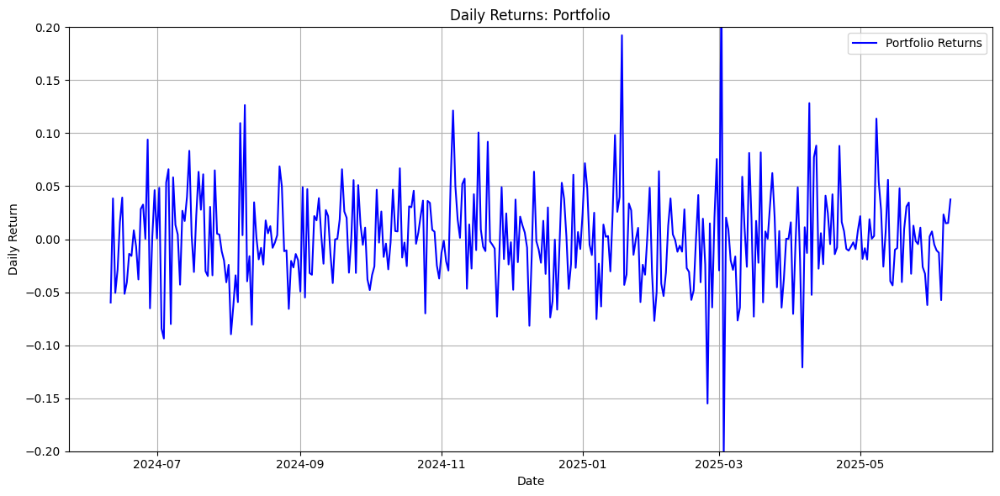

In [216]:
plot_returns(SOL_data)

#### AVAX:

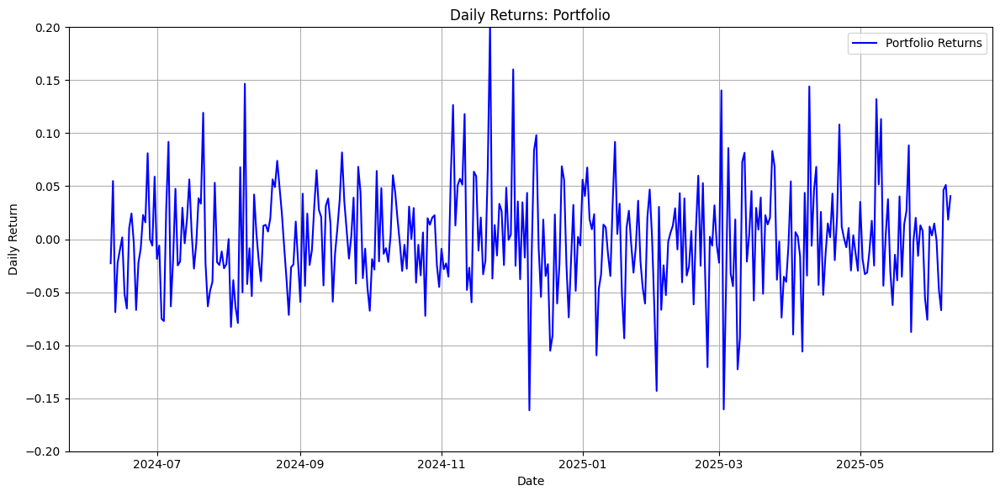

In [217]:
plot_returns(AVAX_data)

#### Invesitgating lowest 5 AQMS

#### SHIB:

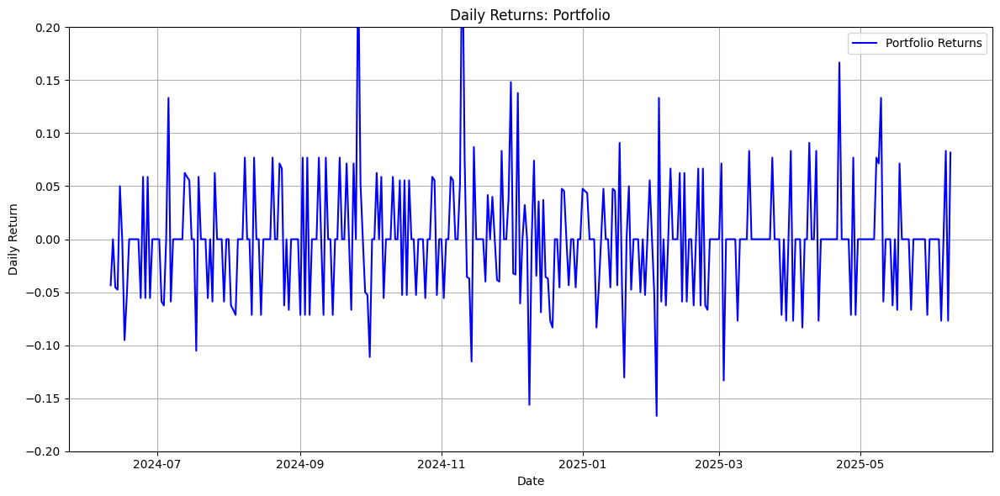

In [220]:
plot_returns(SHIB_data)

#### USDC:

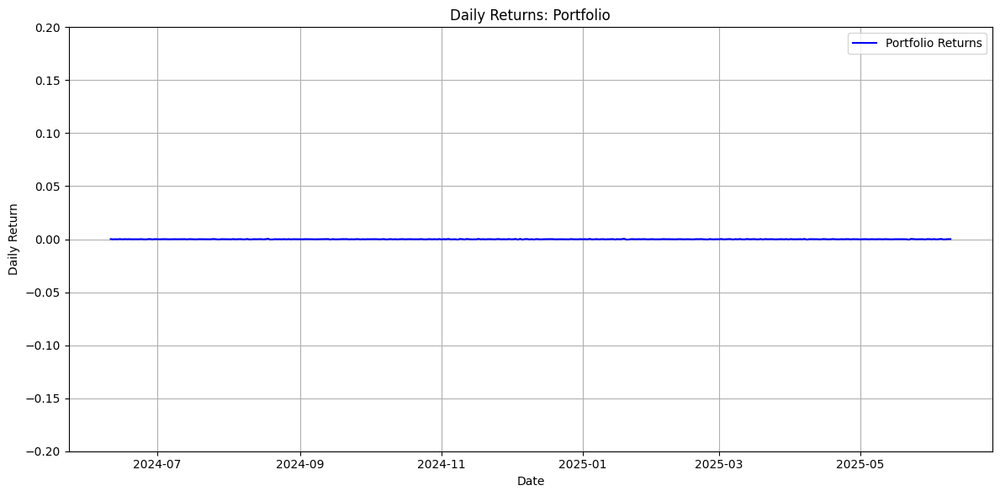

In [221]:
plot_returns(USDC_data)

#### ENJ:

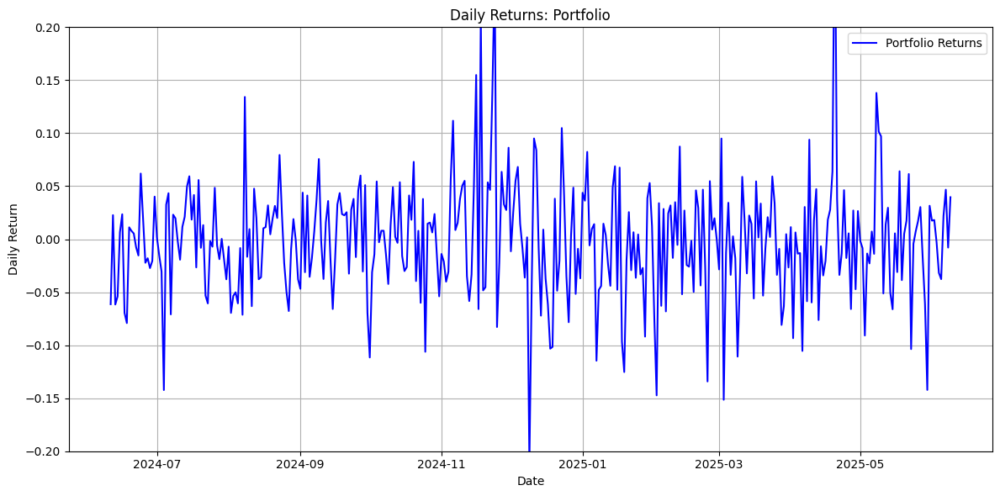

In [222]:
plot_returns(ENJ_data)

#### SAND:

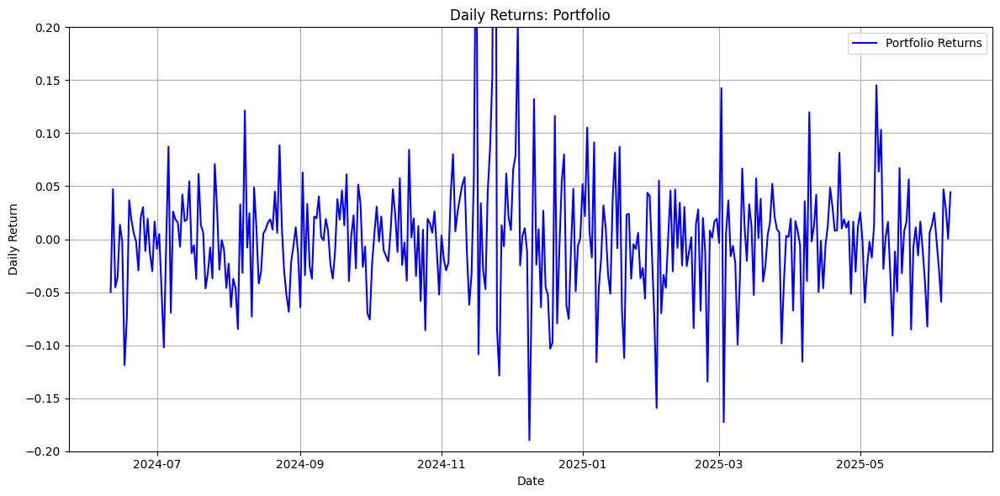

In [223]:
plot_returns(SAND_data)

#### XTZ:

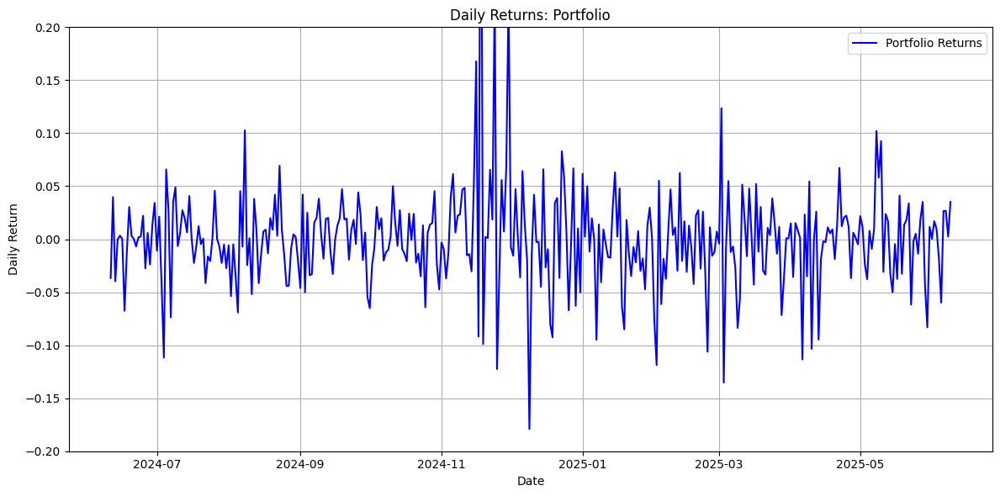

In [226]:
plot_returns(XTZ_data)

## Volatility Score and AQM of all 10 Portfolios:

### Volatility Score:

In [185]:
portfolio_vol_scores_df

,Portfolio,Volatility_Score_BTC,Volatility_Score_Total,Volatility_Score_SP500,Volatility_Score_MAG7
0,Portfolio 1: Conservative Portfolio,0.375121,0.862535,2.429114,1.167003
1,Portfolio 2: Balanced Portfolio,0.773813,1.598558,4.719464,2.251840
2,Portfolio 3: Growth Portfolio,0.750937,1.704959,4.756805,2.300040
3,Portfolio 4: High-Risk Portfolio,1.059213,2.099788,6.112758,2.914623
4,Portfolio 5: Memecoin heavy Portfolio,1.513586,2.460068,7.951783,3.715549
5,Portfolio 6: DeFi Portfolio,1.118940,2.164743,7.450628,3.536236
6,Portfolio 7: NFT/Metaverse Portfolio,0.951068,1.946735,5.645880,2.703595
7,Portfolio 8: Tech-Oriented Portfolio,1.207974,2.169449,6.890024,3.267337
8,Portfolio 9: Ultra-diversified Portfolio,1.723256,2.604549,9.179092,4.274154
9,Portfolio 10: Aggresive Small-Cap Portfolio,1.214392,1.976117,6.249874,2.979847


#### Sorted Descending by Total Market Cap:

In [227]:
portfolio_vol_scores_df.sort_values(by='Volatility_Score_Total', ascending=False)

,Portfolio,Volatility_Score_BTC,Volatility_Score_Total,Volatility_Score_SP500,Volatility_Score_MAG7
8,Portfolio 9: Ultra-diversified Portfolio,1.723256,2.604549,9.179092,4.274154
4,Portfolio 5: Memecoin heavy Portfolio,1.513586,2.460068,7.951783,3.715549
7,Portfolio 8: Tech-Oriented Portfolio,1.207974,2.169449,6.890024,3.267337
5,Portfolio 6: DeFi Portfolio,1.118940,2.164743,7.450628,3.536236
3,Portfolio 4: High-Risk Portfolio,1.059213,2.099788,6.112758,2.914623
9,Portfolio 10: Aggresive Small-Cap Portfolio,1.214392,1.976117,6.249874,2.979847
6,Portfolio 7: NFT/Metaverse Portfolio,0.951068,1.946735,5.645880,2.703595
2,Portfolio 3: Growth Portfolio,0.750937,1.704959,4.756805,2.300040
1,Portfolio 2: Balanced Portfolio,0.773813,1.598558,4.719464,2.251840
0,Portfolio 1: Conservative Portfolio,0.375121,0.862535,2.429114,1.167003


### Highest 3:

/var/folders/5r/1lsvb2gx50n91j4gfq7gvff80000gn/T/ipykernel_1245/4705473.py:46: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = cm.get_cmap('Set1', len(index_dict))


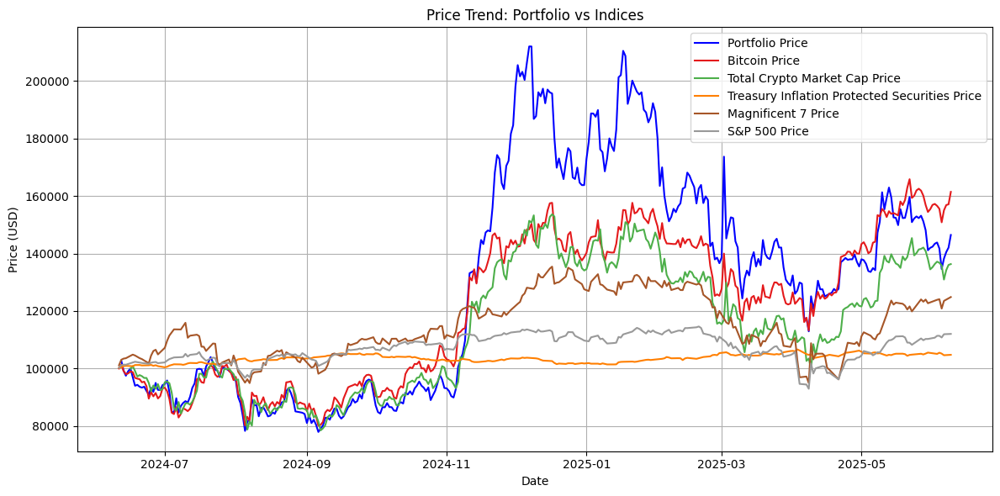

In [228]:
plot_price(portfolio_9_df, index_dict)

/var/folders/5r/1lsvb2gx50n91j4gfq7gvff80000gn/T/ipykernel_1245/4705473.py:46: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = cm.get_cmap('Set1', len(index_dict))


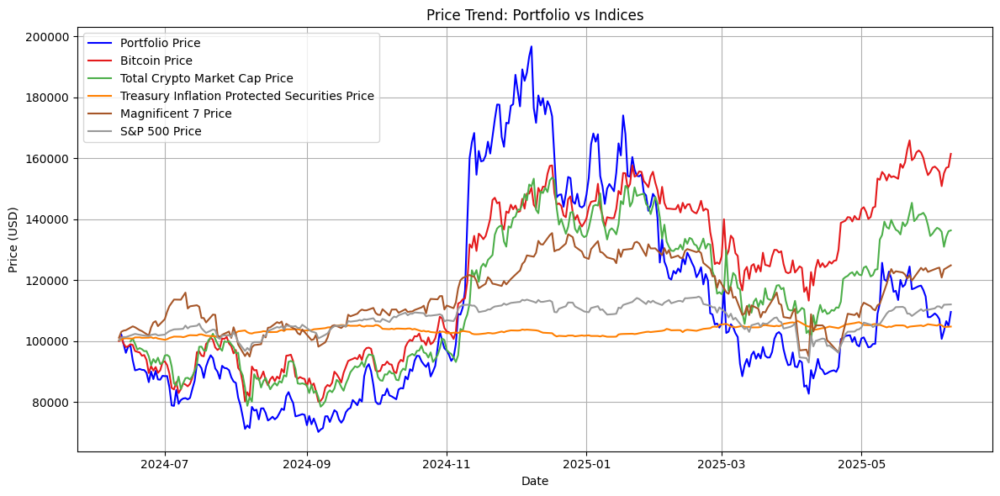

In [229]:
plot_price(portfolio_5_df, index_dict)

/var/folders/5r/1lsvb2gx50n91j4gfq7gvff80000gn/T/ipykernel_1245/4705473.py:46: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = cm.get_cmap('Set1', len(index_dict))


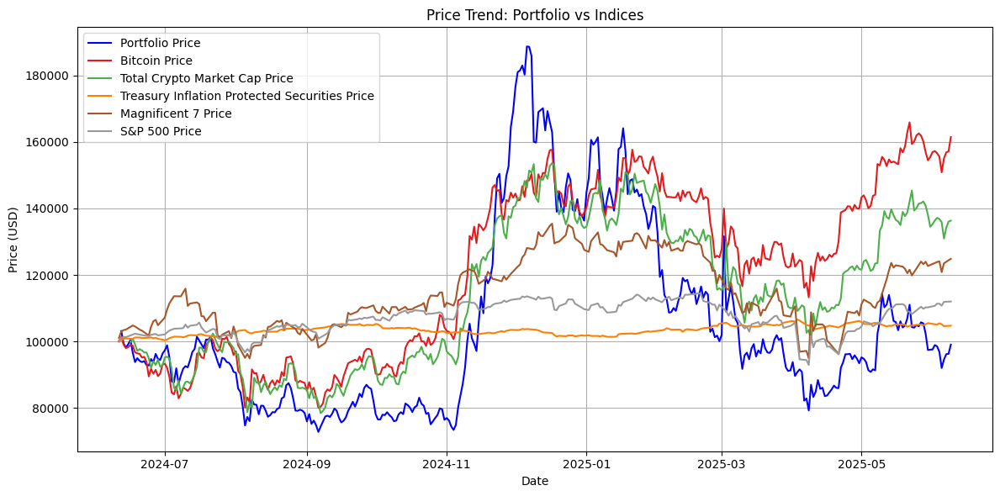

In [230]:
plot_price(portfolio_8_df, index_dict)

#### Lowest 3:

/var/folders/5r/1lsvb2gx50n91j4gfq7gvff80000gn/T/ipykernel_1245/4705473.py:46: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = cm.get_cmap('Set1', len(index_dict))


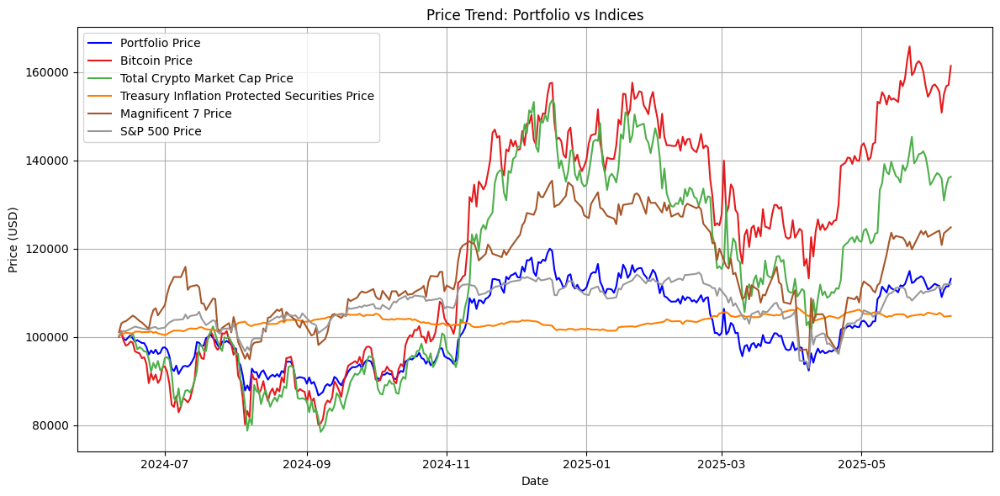

In [231]:
plot_price(portfolio_1_df, index_dict)

/var/folders/5r/1lsvb2gx50n91j4gfq7gvff80000gn/T/ipykernel_1245/4705473.py:46: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = cm.get_cmap('Set1', len(index_dict))


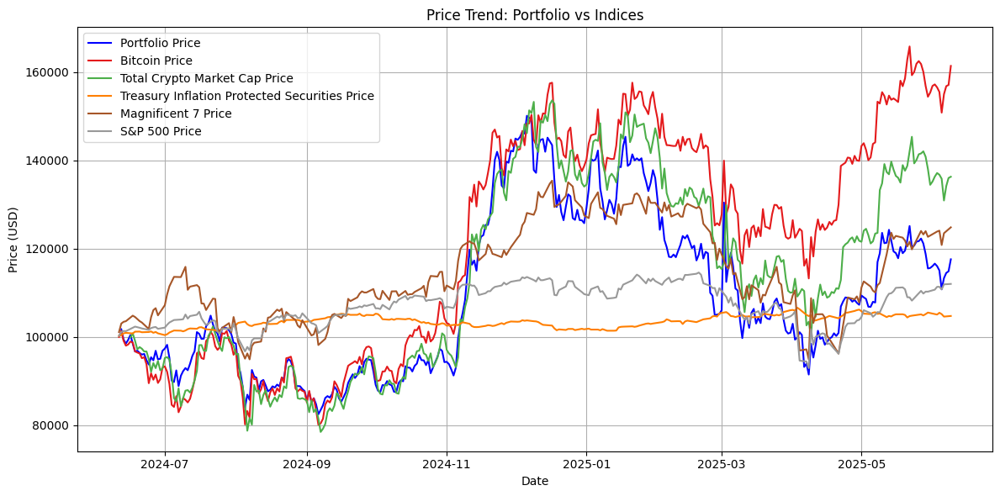

In [232]:
plot_price(portfolio_2_df, index_dict)

/var/folders/5r/1lsvb2gx50n91j4gfq7gvff80000gn/T/ipykernel_1245/4705473.py:46: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = cm.get_cmap('Set1', len(index_dict))


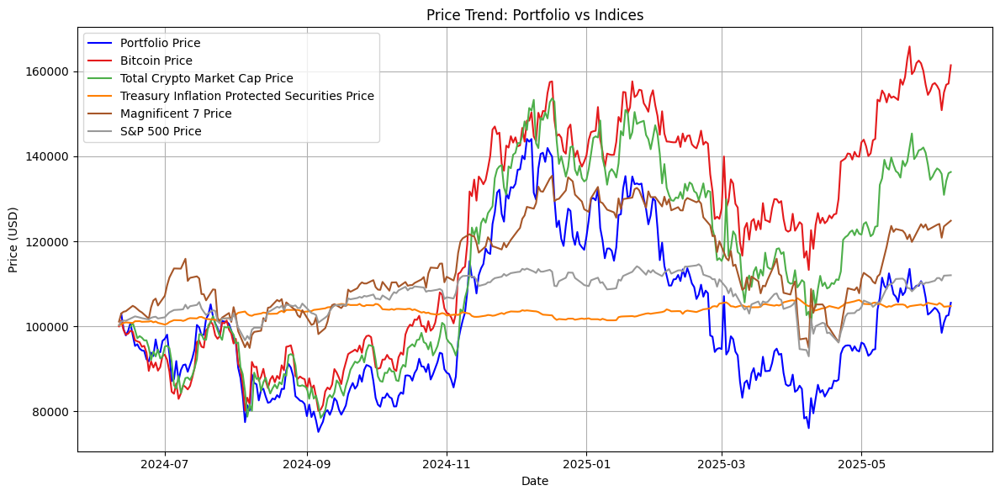

In [233]:
plot_price(portfolio_3_df, index_dict)

In [186]:
AQM_portfolio_df

,Portfolio,AQM_Score_BTC,AQM_Score_TIP,AQM_Score_SP500
0,Portfolio 1: Conservative Portfolio,0.802406,0.076694,0.223354
1,Portfolio 2: Balanced Portfolio,0.694137,0.050633,0.208513
2,Portfolio 3: Growth Portfolio,0.760495,0.053860,0.226042
3,Portfolio 4: High-Risk Portfolio,0.764276,0.056679,0.213962
4,Portfolio 5: Memecoin heavy Portfolio,0.691626,0.061425,0.181969
5,Portfolio 6: DeFi Portfolio,0.496308,0.141103,0.280672
6,Portfolio 7: NFT/Metaverse Portfolio,0.543359,0.004616,0.151545
7,Portfolio 8: Tech-Oriented Portfolio,0.541036,0.029378,0.167745
8,Portfolio 9: Ultra-diversified Portfolio,0.695155,0.061621,0.209854
9,Portfolio 10: Aggresive Small-Cap Portfolio,0.451432,0.116914,0.211792


#### Sorted Descending by BTC

In [234]:
AQM_portfolio_df.sort_values(by='AQM_Score_BTC', ascending=False)

,Portfolio,AQM_Score_BTC,AQM_Score_TIP,AQM_Score_SP500
0,Portfolio 1: Conservative Portfolio,0.802406,0.076694,0.223354
3,Portfolio 4: High-Risk Portfolio,0.764276,0.056679,0.213962
2,Portfolio 3: Growth Portfolio,0.760495,0.053860,0.226042
8,Portfolio 9: Ultra-diversified Portfolio,0.695155,0.061621,0.209854
1,Portfolio 2: Balanced Portfolio,0.694137,0.050633,0.208513
4,Portfolio 5: Memecoin heavy Portfolio,0.691626,0.061425,0.181969
6,Portfolio 7: NFT/Metaverse Portfolio,0.543359,0.004616,0.151545
7,Portfolio 8: Tech-Oriented Portfolio,0.541036,0.029378,0.167745
5,Portfolio 6: DeFi Portfolio,0.496308,0.141103,0.280672
9,Portfolio 10: Aggresive Small-Cap Portfolio,0.451432,0.116914,0.211792


#### Highest 3:

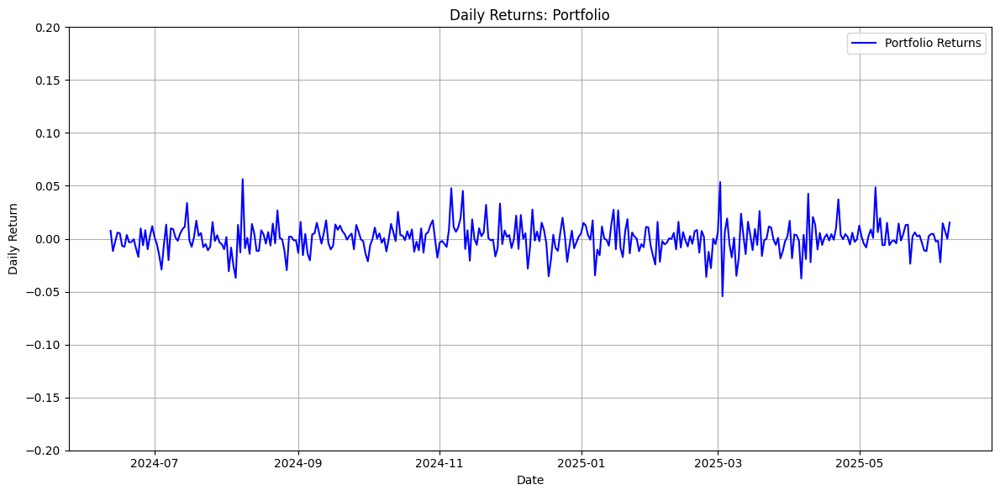

In [236]:
plot_returns(portfolio_1_df)

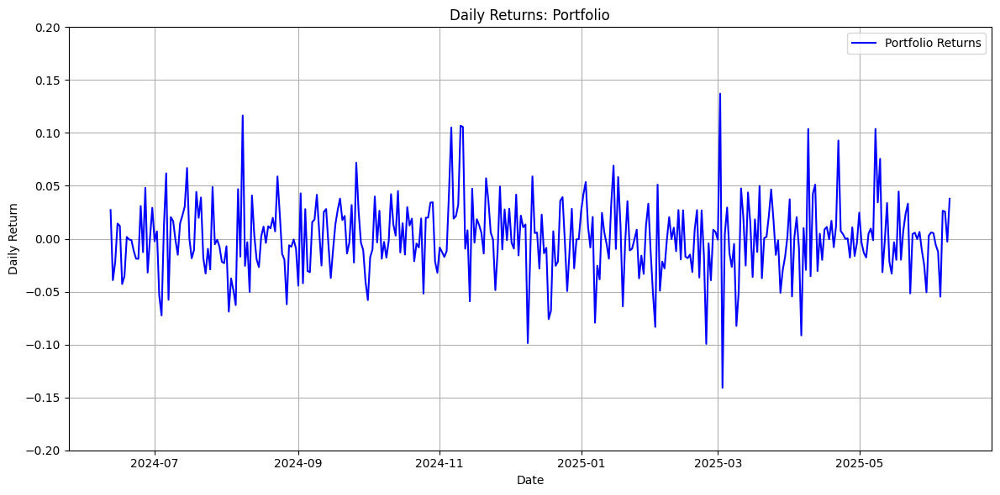

In [237]:
plot_returns(portfolio_4_df)

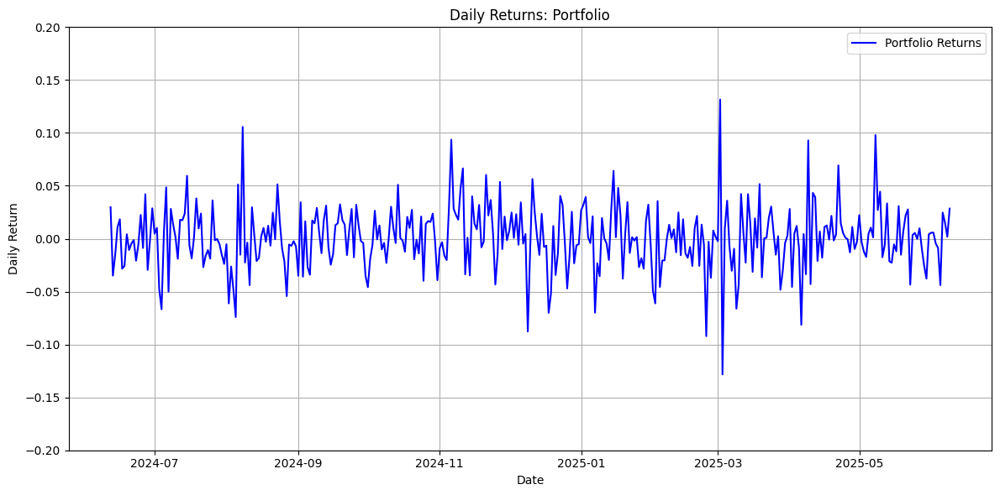

In [238]:
plot_returns(portfolio_3_df)

#### Lowest 3:

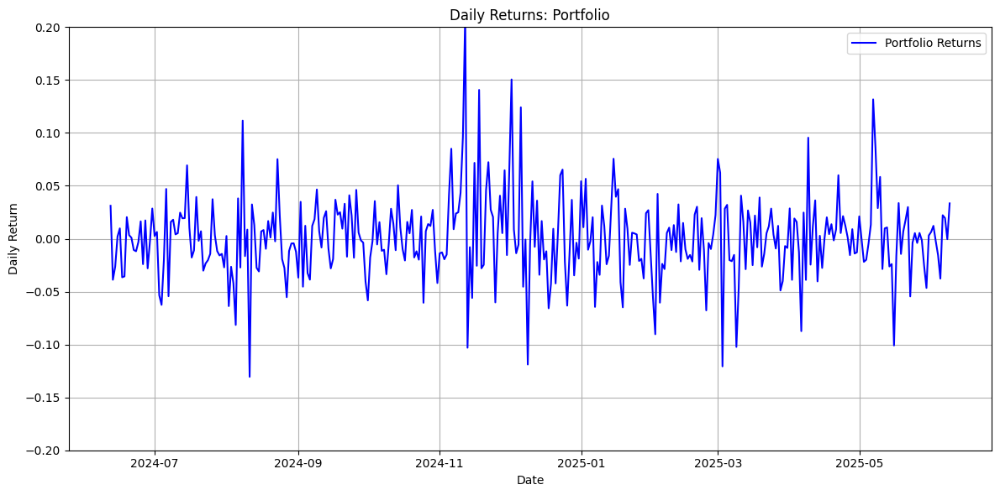

In [239]:
plot_returns(portfolio_10_df)

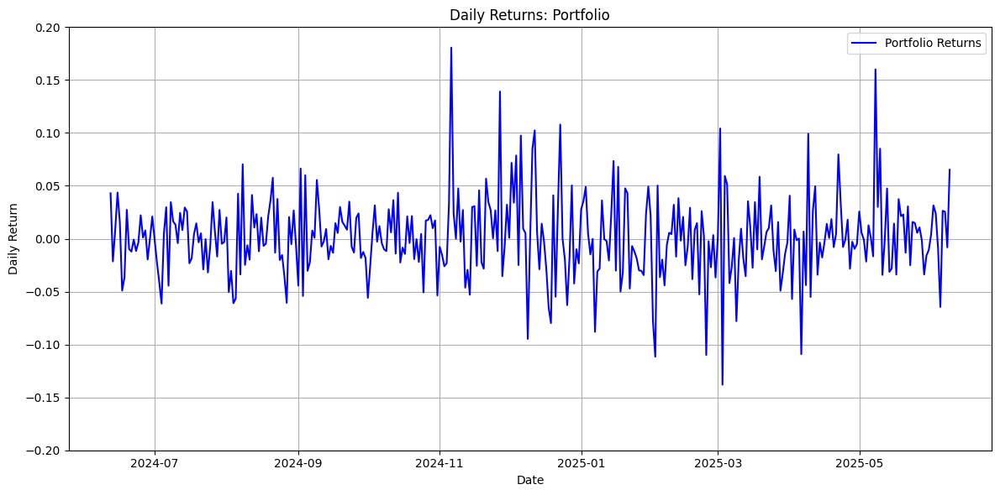

In [240]:
plot_returns(portfolio_6_df)

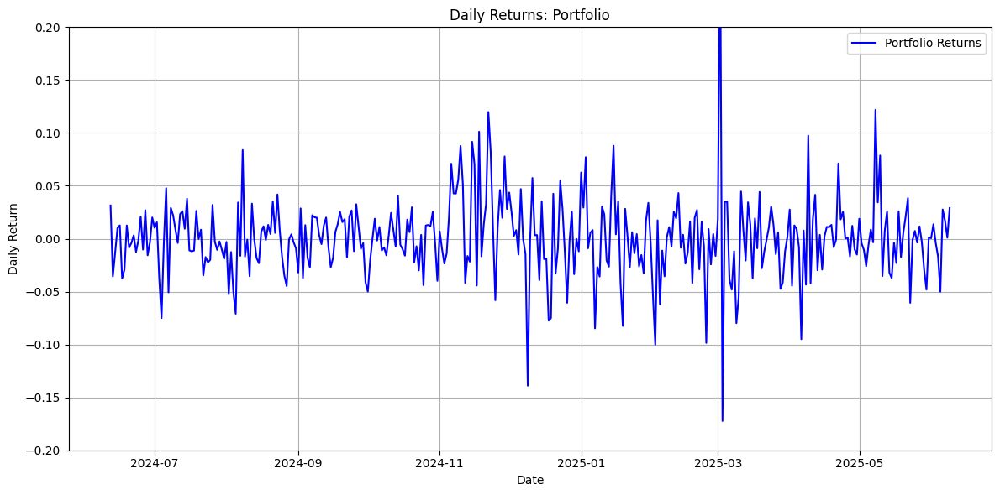

In [241]:
plot_returns(portfolio_8_df)